In [12]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
import os

import utils_

from rpy2 import robjects
import pandas as pd

import tqdm
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.datasets import load_diabetes, make_regression
from sklearn.preprocessing import StandardScaler

In [222]:
def set_random_seeds (seed=1234):
    np.random.seed(seed)
    torch.manual_seed(seed)
    
def synthetic_dataset(n=400, p=10, device='cuda', seed=1234):
    torch.manual_seed(seed)
    # parameters used: sample_size = 10, lambda_size = 500, T0=10, Tn=0.01, epochs//20
    X_tensor = (torch.rand(n, p) - .5).to(device)
    # add column of zero to fit intercept
    # X_tensor = torch.hstack((X_tensor, torch.ones((X_tensor.shape[0], 1)).to(device)))
    # beta = (torch.rand(p + 1) * 2 - 1.).to(device)
    beta = (torch.rand(p) * 2 - 1.).to(device)*.5
    # add gaussian noise eps to observations
    eps = 5e-1
    y_tensor = torch.normal(X_tensor @ beta, torch.ones(n).to(device) * eps)

    X_np = X_tensor.cpu().detach().numpy()
    y_np = y_tensor.cpu().detach().numpy()

    # compute regression parameters
    reg = LinearRegression().fit(X_np, y_np)
    r2_score = reg.score(X_np, y_np)
    print(f"R^2 score: {r2_score:.4f}")
    sigma_regr = np.sqrt(np.mean(np.square(y_np - X_np @ reg.coef_)))
    print(f"Sigma regression: {sigma_regr:.4f}")

    return X_tensor, y_tensor, X_np, y_np

def scikit_regression(n_samples, n_features, noise, seed=1234):
    scaler = StandardScaler()
    X_np, y_np = make_regression(n_samples=n_samples, n_features=n_features, noise=noise, random_state=seed)
    X_np = scaler.fit_transform(X_np)
    y_np = scaler.fit_transform(y_np.reshape(-1, 1))
    X_tensor = torch.from_numpy(X_np).float().to(device)
    y_tensor = torch.from_numpy(y_np.reshape(-1)).float().to(device)
    
    # compute regression parameters
    reg = LinearRegression().fit(X_np, y_np)
    r2_score = reg.score(X_np, y_np)
    print(f"R^2 score: {r2_score:.4f}")
    sigma_regr = np.sqrt(np.mean(np.square(y_np - X_np @ reg.coef_.T)))
    print(f"Sigma regression: {sigma_regr:.4f}")
    
    return X_tensor, y_tensor, X_np, y_np
    
def load_diabetes_dataset(device='cuda'):
    df = load_diabetes()
    scaler = StandardScaler()
    X_np = scaler.fit_transform(df.data)
    y_np = scaler.fit_transform(df.target.reshape(-1, 1))[:, 0]
    X_tensor = torch.from_numpy(X_np).float().to(device)
    y_tensor = torch.from_numpy(y_np.reshape(-1)).float().to(device)
    
    # compute regression parameters
    reg = LinearRegression().fit(X_np, y_np)
    r2_score = reg.score(X_np, y_np)
    print(f"R^2 score: {r2_score:.4f}")
    sigma_regr = np.sqrt(np.mean(np.square(y_np - X_np @ reg.coef_)))
    print(f"Sigma regression: {sigma_regr:.4f}")
    print(f"Norm coefficients: {np.linalg.norm(reg.coef_):.4f}")

    return X_tensor, y_tensor, X_np, y_np

def load_prostate_cancer (device='cuda'):
    data_df = pd.read_csv("./data/prostate.csv", delimiter=",")
    X_np = data_df[data_df.columns[:8]].to_numpy()
    y_np = data_df[data_df.columns[8]].to_numpy()
    scaler = StandardScaler()
    X_np = scaler.fit_transform(X_np)
    # y_np -= y_np.mean(0)
    y_np = scaler.fit_transform(y_np.reshape(-1, 1))
    X_tensor = torch.from_numpy(X_np).float().to(device)
    y_tensor = torch.from_numpy(y_np.reshape(-1)).float().to(device)
    
    # compute regression parameters
    reg = LinearRegression(fit_intercept=False).fit(X_np, y_np)
    r2_score = reg.score(X_np, y_np)
    print(f"R^2 score: {r2_score:.4f}")
    sigma_regr = np.sqrt(np.mean(np.square(y_np - X_np @ reg.coef_.T)))
    print(f"Sigma regression: {sigma_regr:.4f}")
    
    return X_tensor, y_tensor, X_np, y_np

In [248]:
def synthetic_dataset(n=400, p=10, device='cuda', seed=1234):
    torch.manual_seed(seed)
    # parameters used: sample_size = 10, lambda_size = 500, T0=10, Tn=0.01, epochs//20
    means = (torch.rand(p) - .5).to(device)#*0.5
    std = torch.rand(p).to(device)#*0.05
    X_tensor = torch.distributions.MultivariateNormal(means, torch.diag(std)).sample(torch.Size([n])).to(device)
    # add column of zero to fit intercept
    # X_tensor = torch.hstack((X_tensor, torch.ones((X_tensor.shape[0], 1)).to(device)))
    # beta = (torch.rand(p + 1) * 2 - 1.).to(device)
    beta = (torch.rand(p) - .5).to(device) * 0.1
    # add gaussian noise eps to observations
    eps = 1.3e-1
    y_tensor = torch.normal(X_tensor @ beta, torch.ones(n).to(device) * eps)

    X_np = X_tensor.cpu().detach().numpy()
    y_np = y_tensor.cpu().detach().numpy()
    
    plt.figure(figsize=(14,7))
    for i in range(X_np.shape[0]):
        plt.scatter(range(0,p), X_np[i], alpha=0.25)
    plt.plot(range(0,p), means.detach().cpu().numpy(), marker='X')
    plt.show()

    # compute regression parameters
    reg = LinearRegression().fit(X_np, y_np)
    r2_score = reg.score(X_np, y_np)
    print(f"R^2 score: {r2_score:.4f}")
    sigma_regr = np.sqrt(np.mean(np.square(y_np - X_np @ reg.coef_)))
    print(f"Sigma regression: {sigma_regr:.4f}")

    return X_tensor, y_tensor, X_np, y_np

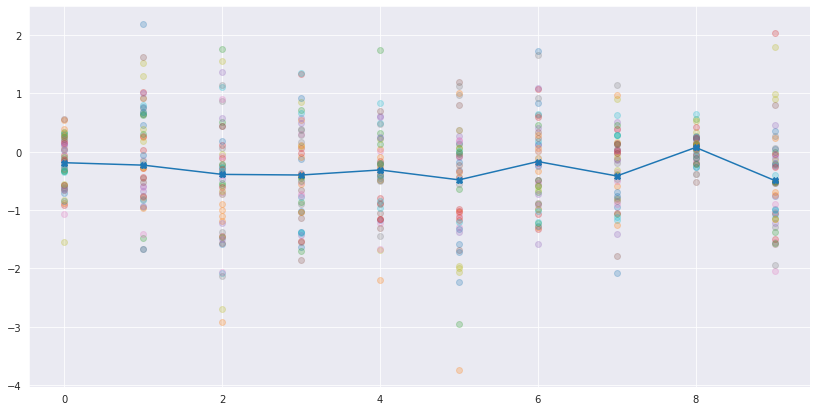

R^2 score: 0.4211
Sigma regression: 0.0961


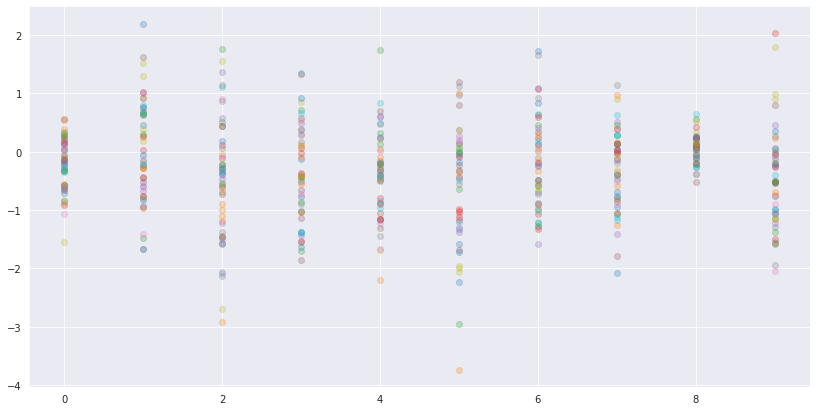

100%|██████████| 200/200 [00:00<00:00, 2134.65it/s]


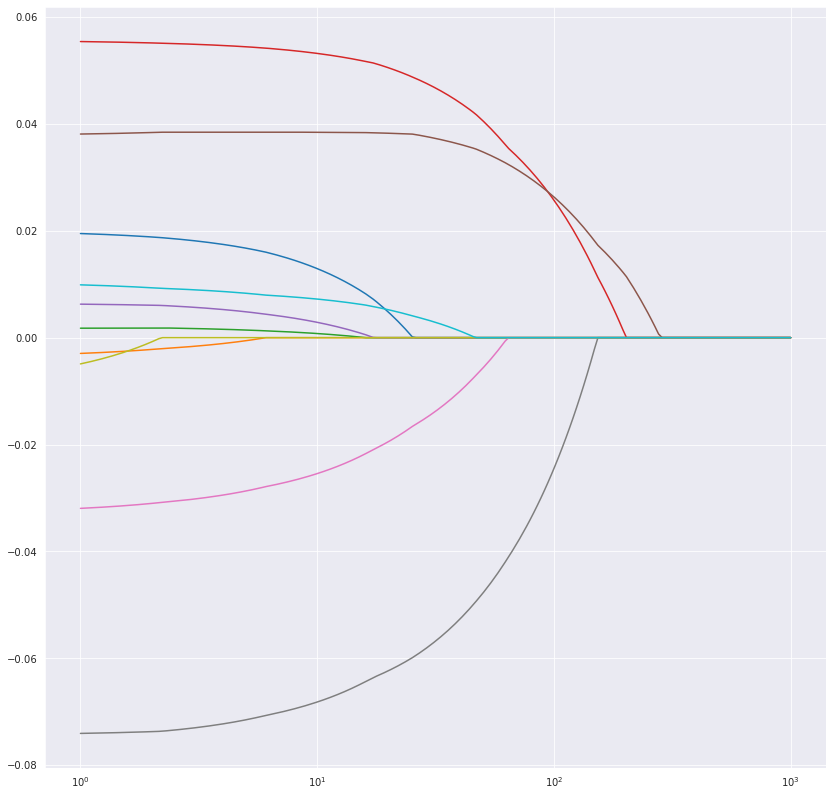

In [252]:
X_tensor, y_tensor, X_np, y_np = synthetic_dataset(n=50, p=10, seed=666)
# X_tensor, y_tensor, X_np, y_np = load_prostate_cancer()

plt.figure(figsize=(14,7))
for i in range(X_np.shape[0]):
    plt.scatter(range(0,X_np.shape[-1]), X_np[i], alpha=0.25)
plt.show()

sigma_regr = 0.1
alphas_lasso = np.logspace(0, 3, 200)
beta_sklearn = np.array(
    [Lasso(alpha=alpha, fit_intercept=False).fit(X_np, y_np).coef_ for alpha in
     tqdm.tqdm(alphas_lasso * sigma_regr ** 2 / X_np.shape[0])])
plt.figure(figsize=(14, 14))
plt.plot(alphas_lasso, beta_sklearn)
# plt.plot(alphas_lasso[-50:], 95/alphas_lasso[-50:], linestyle='dashed')
plt.xscale('log')
plt.show()

In [253]:
device = 'cuda'
set_random_seeds(1234)

dir_name = "./plots/"
if not os.path.exists(dir_name):
    os.makedirs(dir_name)
    
# build model
flow_dim = X_tensor.shape[1]
q = 1
flow_params = dict(flow_dim=flow_dim, 
                   q=q, 
                   n_layers=5, 
                   context_features=256, 
                   hidden_features=256, 
                   device=device)

### Train conditional flow with Laplace prior

In [304]:
train_params = dict(q=q,
                  sigma=torch.tensor(0.1),
                  lr=1e-4,#,1e-4,
                  epochs=1000,
                  T0=5,
                  Tn=1,
                  iter_per_cool_step=25,
                  lambda_min_exp=1,#-1,
                  lambda_max_exp=3,#3,
                  sample_size=1,
                  context_size=1000,
                  device=device)

In [275]:
# flow = utils_.build_cond_flow(**flow_params)
# flow.load_state_dict(torch.load("./models/flow_T_1"))

Training loss at step 0: 18875.8 and 3764.6 * (T = 5.000)
Training loss at step 1: 16042.5 and 3198.6 * (T = 5.000)
Training loss at step 2: 12480.3 and 2486.9 * (T = 5.000)
Training loss at step 3: 10821.0 and 2155.8 * (T = 5.000)
Training loss at step 4: 8813.7 and 1755.2 * (T = 5.000)
Training loss at step 5: 6684.0 and 1330.5 * (T = 5.000)
Training loss at step 6: 5511.6 and 1097.0 * (T = 5.000)
Training loss at step 7: 4380.7 and 872.2 * (T = 5.000)
Training loss at step 8: 3573.0 and 712.2 * (T = 5.000)
Training loss at step 9: 2899.3 and 578.8 * (T = 5.000)
Training loss at step 10: 2354.1 and 471.4 * (T = 5.000)
Training loss at step 11: 1864.9 and 375.2 * (T = 5.000)
Training loss at step 12: 1574.7 and 318.7 * (T = 5.000)
Training loss at step 13: 1332.8 and 272.1 * (T = 5.000)
Training loss at step 14: 1192.7 and 245.7 * (T = 5.000)
Training loss at step 15: 992.0 and 207.4 * (T = 5.000)
Training loss at step 16: 763.0 and 163.3 * (T = 5.000)
Training loss at step 17: 592.3 

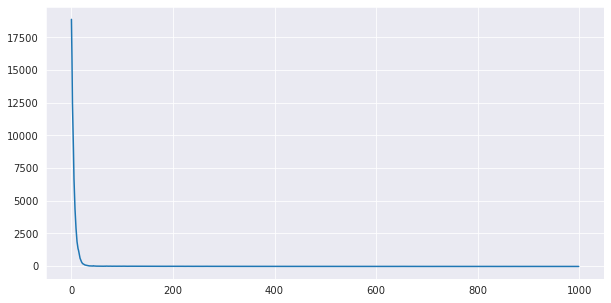

100%|██████████| 1000/1000 [00:00<00:00, 2263.42it/s]


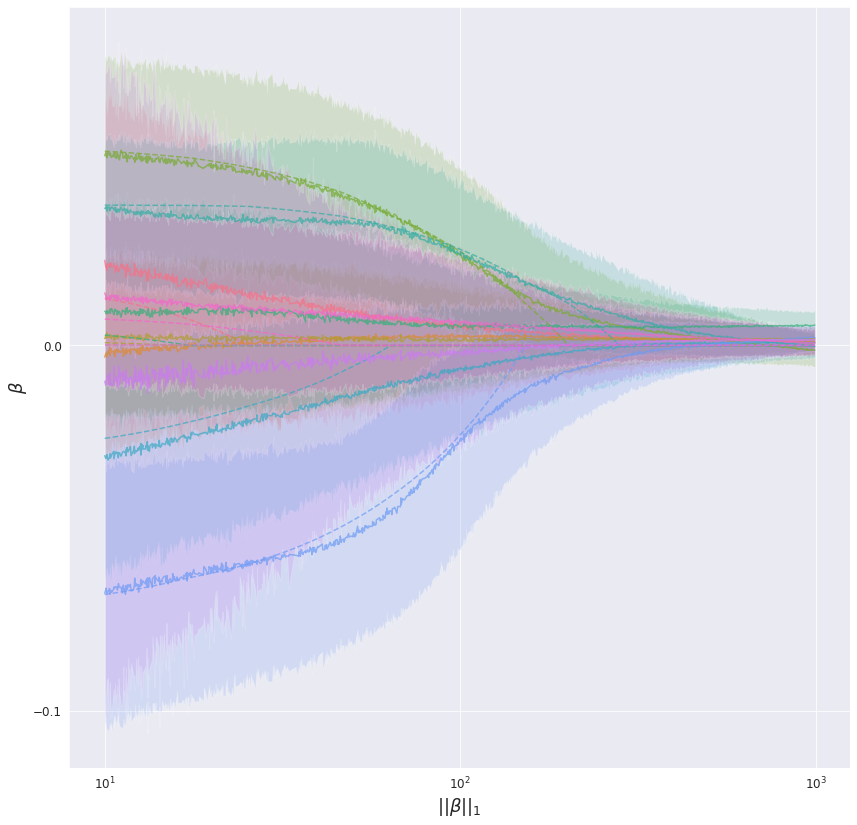

norms: min=0.0 max=1.6
min samples per bin 0


/home/negri0001/Documents/Marcello/cond_flows/manifold_flow/utils_.py:465: RuntimeWarning: Mean of empty slice.
  bin_means = np.array([all_samples[digitized == i][:min_n_per_bin].mean(0) for i in range(1, len(bins))])
/home/negri0001/.local/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


IndexError: cannot do a non-empty take from an empty axes.

In [313]:
act = 'elu_20.0'
flow = utils_.build_cond_flow(**flow_params)
flow, loss, loss_T = utils_.train_cond_model(flow, X=X_tensor, y=y_tensor, act=act, **train_params)
# torch.save(flow.state_dict(), "./models/flow_T_1")
flow.eval()
plt.figure(figsize=(10, 5))
plt.plot(range(len(loss)), loss, label='loss')
plt.show()
samples_sorted, lambda_sorted, kl_sorted = utils_.sample_beta_exp(flow, X_tensor, y_tensor, q=train_params['q'], act=act, sigma=train_params['sigma'], lambda_min_exp=train_params['lambda_min_exp'], 
                                                     lambda_max_exp=train_params['lambda_max_exp'], context_size=1, sample_size=1000, n_iter=1000, device='cuda')
bins, samples_norm, bin_l_quant, bin_means, bin_r_quant = utils_.plot_betas_lambda(samples_sorted, lambda_sorted,  X_np, y_np, min_bin=0.5, max_bin=2, n_bins=51,
                                                                                  sigma=train_params['sigma'], norm=train_params['q'], a=0.95, folder_name=dir_name, n_plots=1) 

opt lambda:  79.5751 61.272829895019534


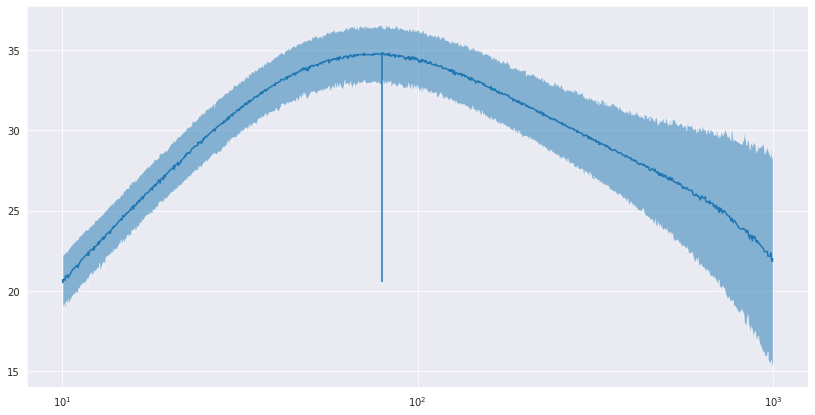

In [310]:
mll = -kl_sorted
mll_mean = mll.mean(1)
mll_l = np.quantile(mll, 0.05, axis=1)
mll_r = np.quantile(mll, 0.95, axis=1)
fig, ax = plt.subplots(figsize=(14,7))
max_mll = np.argmax(mll_mean)
print("opt lambda: ", lambda_sorted[max_mll], lambda_sorted[max_mll]*0.77)
ax.plot(lambda_sorted, mll_mean)
ax.fill_between(lambda_sorted, mll_l, mll_r, alpha=0.5)
plt.vlines(lambda_sorted[max_mll], ymin=mll_mean.min(), ymax=mll_mean.max())
plt.xscale('log')
plt.show()

opt lambda:  53.23045 40.987446250915525


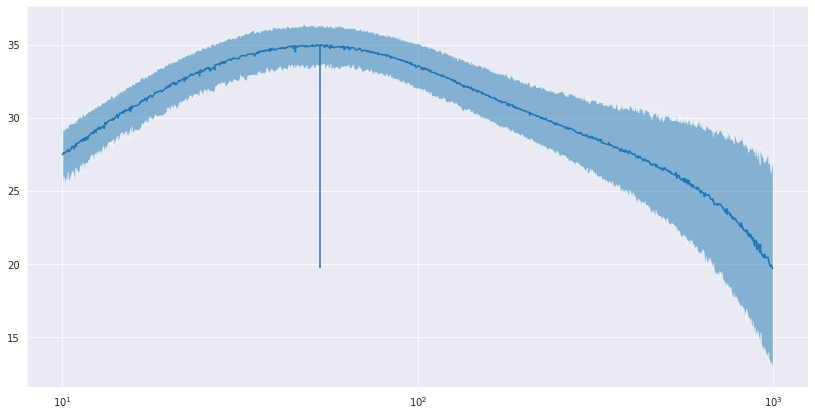

In [314]:
mll = -kl_sorted
mll_mean = mll.mean(1)
mll_l = np.quantile(mll, 0.05, axis=1)
mll_r = np.quantile(mll, 0.95, axis=1)
fig, ax = plt.subplots(figsize=(14,7))
max_mll = np.argmax(mll_mean)
print("opt lambda: ", lambda_sorted[max_mll], lambda_sorted[max_mll]*0.77)
ax.plot(lambda_sorted, mll_mean)
ax.fill_between(lambda_sorted, mll_l, mll_r, alpha=0.5)
plt.vlines(lambda_sorted[max_mll], ymin=mll_mean.min(), ymax=mll_mean.max())
plt.xscale('log')
plt.show()

opt lambda:  87.85762 67.65036758422852


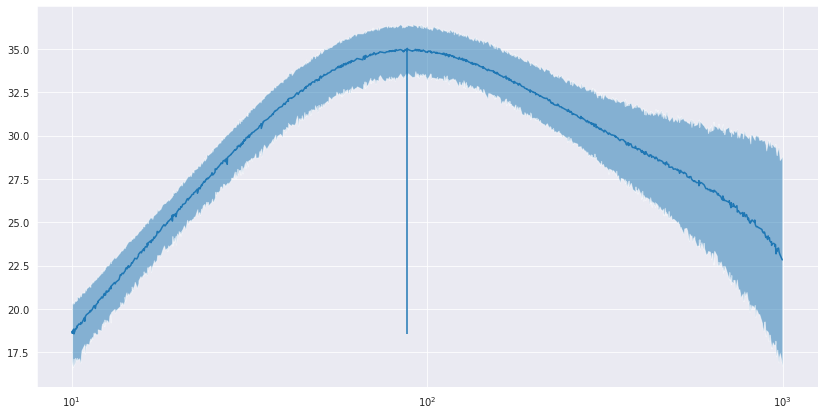

In [312]:
mll = -kl_sorted
mll_mean = mll.mean(1)
mll_l = np.quantile(mll, 0.05, axis=1)
mll_r = np.quantile(mll, 0.95, axis=1)
fig, ax = plt.subplots(figsize=(14,7))
max_mll = np.argmax(mll_mean)
print("opt lambda: ", lambda_sorted[max_mll], lambda_sorted[max_mll]*0.77)
ax.plot(lambda_sorted, mll_mean)
ax.fill_between(lambda_sorted, mll_l, mll_r, alpha=0.5)
plt.vlines(lambda_sorted[max_mll], ymin=mll_mean.min(), ymax=mll_mean.max())
plt.xscale('log')
plt.show()

In [315]:
monotone_activations = ["tanh_20.0", "tanh_10.0", "tanh_1.0", "elu_20.0", "elu_10.0", "elu_1.0"]
samples = {}
for act in monotone_activations:
    flow = utils_.build_cond_flow(flow_dim, q=q, n_layers=5, context_features=128, hidden_features=256, device=device)
    flow, loss, loss_T = utils_.train_cond_model(flow, X=X_tensor, y=y_tensor, act=act, **train_params)
    # torch.save(flow.state_dict(), "./models/flow_T_1")

Training loss at step 0: 18879.3 and 3765.1 * (T = 5.000)
Training loss at step 1: 15986.8 and 3187.2 * (T = 5.000)
Training loss at step 2: 13141.5 and 2618.9 * (T = 5.000)
Training loss at step 3: 10755.3 and 2142.4 * (T = 5.000)
Training loss at step 4: 9354.8 and 1863.1 * (T = 5.000)
Training loss at step 5: 6817.7 and 1357.0 * (T = 5.000)
Training loss at step 6: 5625.6 and 1119.5 * (T = 5.000)
Training loss at step 7: 4016.4 and 799.3 * (T = 5.000)
Training loss at step 8: 3064.6 and 610.3 * (T = 5.000)
Training loss at step 9: 2404.3 and 479.8 * (T = 5.000)
Training loss at step 10: 1739.5 and 348.4 * (T = 5.000)
Training loss at step 11: 1318.0 and 265.8 * (T = 5.000)
Training loss at step 12: 993.2 and 202.7 * (T = 5.000)
Training loss at step 13: 609.1 and 128.0 * (T = 5.000)
Training loss at step 14: 473.0 and 102.8 * (T = 5.000)
Training loss at step 15: 352.2 and 80.3 * (T = 5.000)
Training loss at step 16: 275.2 and 67.0 * (T = 5.000)
Training loss at step 17: 187.0 and 5

Training loss at step 0: 19002.3 and 3789.6 * (T = 5.000)
Training loss at step 1: 15954.0 and 3180.5 * (T = 5.000)
Training loss at step 2: 13267.8 and 2644.0 * (T = 5.000)
Training loss at step 3: 10623.0 and 2115.9 * (T = 5.000)
Training loss at step 4: 8463.3 and 1684.9 * (T = 5.000)
Training loss at step 5: 6677.6 and 1328.8 * (T = 5.000)
Training loss at step 6: 5361.5 and 1066.6 * (T = 5.000)
Training loss at step 7: 4049.2 and 805.6 * (T = 5.000)
Training loss at step 8: 3281.5 and 653.4 * (T = 5.000)
Training loss at step 9: 2335.5 and 465.7 * (T = 5.000)
Training loss at step 10: 1778.5 and 356.1 * (T = 5.000)
Training loss at step 11: 1439.0 and 289.6 * (T = 5.000)
Training loss at step 12: 1035.8 and 211.3 * (T = 5.000)
Training loss at step 13: 747.1 and 155.5 * (T = 5.000)
Training loss at step 14: 576.1 and 123.5 * (T = 5.000)
Training loss at step 15: 456.6 and 101.8 * (T = 5.000)
Training loss at step 16: 359.8 and 84.6 * (T = 5.000)
Training loss at step 17: 277.0 and

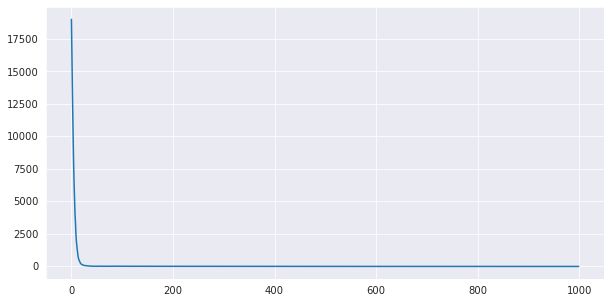

Training loss at step 0: 19098.5 and 3808.8 * (T = 5.000)
Training loss at step 1: 16599.9 and 3309.6 * (T = 5.000)
Training loss at step 2: 13695.9 and 2729.6 * (T = 5.000)
Training loss at step 3: 11416.2 and 2274.4 * (T = 5.000)
Training loss at step 4: 9114.2 and 1814.8 * (T = 5.000)
Training loss at step 5: 6948.1 and 1382.7 * (T = 5.000)
Training loss at step 6: 5635.6 and 1121.3 * (T = 5.000)
Training loss at step 7: 4069.5 and 809.4 * (T = 5.000)
Training loss at step 8: 2878.2 and 572.8 * (T = 5.000)
Training loss at step 9: 2270.9 and 452.9 * (T = 5.000)
Training loss at step 10: 1589.5 and 318.3 * (T = 5.000)
Training loss at step 11: 1061.5 and 214.5 * (T = 5.000)
Training loss at step 12: 747.0 and 153.7 * (T = 5.000)
Training loss at step 13: 531.3 and 112.5 * (T = 5.000)
Training loss at step 14: 376.9 and 83.8 * (T = 5.000)
Training loss at step 15: 227.8 and 56.8 * (T = 5.000)
Training loss at step 16: 160.0 and 45.3 * (T = 5.000)
Training loss at step 17: 108.7 and 37

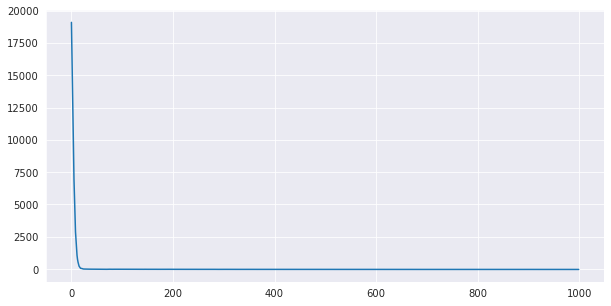

Training loss at step 0: 18595.8 and 3708.5 * (T = 5.000)
Training loss at step 1: 15178.4 and 3025.8 * (T = 5.000)
Training loss at step 2: 12376.8 and 2466.3 * (T = 5.000)
Training loss at step 3: 10260.5 and 2043.9 * (T = 5.000)
Training loss at step 4: 7508.1 and 1494.6 * (T = 5.000)
Training loss at step 5: 5973.5 and 1188.7 * (T = 5.000)
Training loss at step 6: 4232.4 and 842.1 * (T = 5.000)
Training loss at step 7: 3247.9 and 646.4 * (T = 5.000)
Training loss at step 8: 2365.1 and 471.5 * (T = 5.000)
Training loss at step 9: 1695.5 and 339.3 * (T = 5.000)
Training loss at step 10: 1198.2 and 241.7 * (T = 5.000)
Training loss at step 11: 856.5 and 175.4 * (T = 5.000)
Training loss at step 12: 606.1 and 127.4 * (T = 5.000)
Training loss at step 13: 454.5 and 99.4 * (T = 5.000)
Training loss at step 14: 346.1 and 79.7 * (T = 5.000)
Training loss at step 15: 276.5 and 67.6 * (T = 5.000)
Training loss at step 16: 211.6 and 57.0 * (T = 5.000)
Training loss at step 17: 169.5 and 51.0 

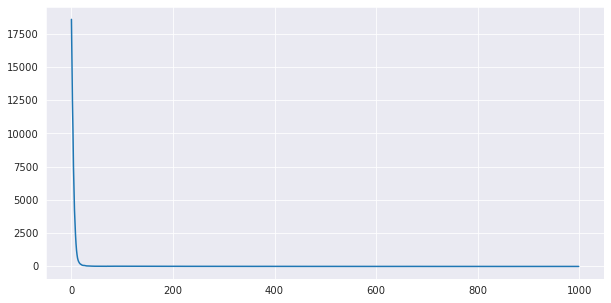

Training loss at step 0: 18583.3 and 3705.9 * (T = 5.000)
Training loss at step 1: 15037.1 and 2997.4 * (T = 5.000)
Training loss at step 2: 12183.2 and 2427.3 * (T = 5.000)
Training loss at step 3: 9949.4 and 1981.3 * (T = 5.000)
Training loss at step 4: 7226.4 and 1438.0 * (T = 5.000)
Training loss at step 5: 6170.1 and 1227.7 * (T = 5.000)
Training loss at step 6: 4445.0 and 884.1 * (T = 5.000)
Training loss at step 7: 3338.6 and 664.3 * (T = 5.000)
Training loss at step 8: 2505.7 and 499.1 * (T = 5.000)
Training loss at step 9: 1845.9 and 369.1 * (T = 5.000)
Training loss at step 10: 1400.4 and 281.6 * (T = 5.000)
Training loss at step 11: 986.3 and 201.2 * (T = 5.000)
Training loss at step 12: 762.5 and 158.3 * (T = 5.000)
Training loss at step 13: 548.1 and 117.7 * (T = 5.000)
Training loss at step 14: 419.8 and 94.3 * (T = 5.000)
Training loss at step 15: 341.6 and 80.9 * (T = 5.000)
Training loss at step 16: 295.5 and 74.0 * (T = 5.000)
Training loss at step 17: 246.0 and 66.6 

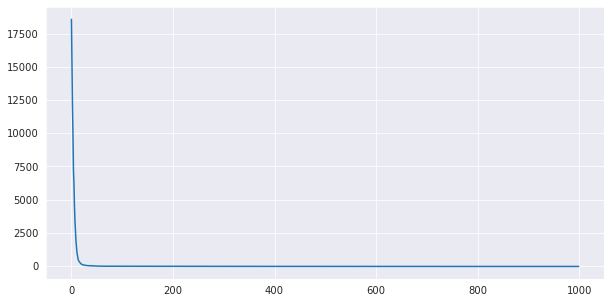

Training loss at step 0: 18756.6 and 3740.6 * (T = 5.000)
Training loss at step 1: 14896.8 and 2969.3 * (T = 5.000)
Training loss at step 2: 12664.0 and 2523.4 * (T = 5.000)
Training loss at step 3: 10441.3 and 2079.7 * (T = 5.000)
Training loss at step 4: 8104.5 and 1613.3 * (T = 5.000)
Training loss at step 5: 6113.2 and 1216.4 * (T = 5.000)
Training loss at step 6: 4744.0 and 943.9 * (T = 5.000)
Training loss at step 7: 3747.6 and 745.9 * (T = 5.000)
Training loss at step 8: 2895.7 and 577.0 * (T = 5.000)
Training loss at step 9: 2168.3 and 433.1 * (T = 5.000)
Training loss at step 10: 1760.6 and 353.5 * (T = 5.000)
Training loss at step 11: 1366.2 and 276.2 * (T = 5.000)
Training loss at step 12: 1094.1 and 223.6 * (T = 5.000)
Training loss at step 13: 858.1 and 178.2 * (T = 5.000)
Training loss at step 14: 680.8 and 144.8 * (T = 5.000)
Training loss at step 15: 546.4 and 119.7 * (T = 5.000)
Training loss at step 16: 380.7 and 88.8 * (T = 5.000)
Training loss at step 17: 273.6 and 

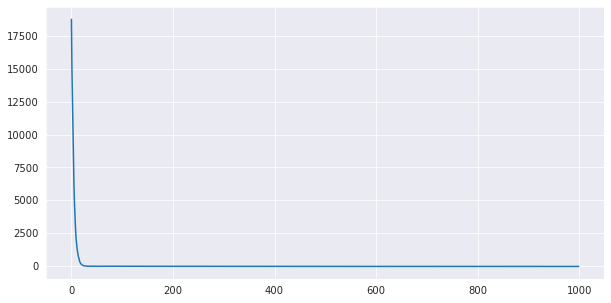

Training loss at step 0: 18837.2 and 3756.6 * (T = 5.000)
Training loss at step 1: 15750.6 and 3140.0 * (T = 5.000)
Training loss at step 2: 12245.6 and 2439.8 * (T = 5.000)
Training loss at step 3: 9868.0 and 1965.2 * (T = 5.000)
Training loss at step 4: 7451.8 and 1483.1 * (T = 5.000)
Training loss at step 5: 5786.6 and 1151.2 * (T = 5.000)
Training loss at step 6: 5123.4 and 1019.6 * (T = 5.000)
Training loss at step 7: 3554.6 and 707.4 * (T = 5.000)
Training loss at step 8: 2857.3 and 569.4 * (T = 5.000)
Training loss at step 9: 1954.3 and 390.7 * (T = 5.000)
Training loss at step 10: 1473.9 and 296.4 * (T = 5.000)
Training loss at step 11: 1103.6 and 224.0 * (T = 5.000)
Training loss at step 12: 860.8 and 177.5 * (T = 5.000)
Training loss at step 13: 595.1 and 126.4 * (T = 5.000)
Training loss at step 14: 441.1 and 97.7 * (T = 5.000)
Training loss at step 15: 316.5 and 75.0 * (T = 5.000)
Training loss at step 16: 259.6 and 65.7 * (T = 5.000)
Training loss at step 17: 204.7 and 57.

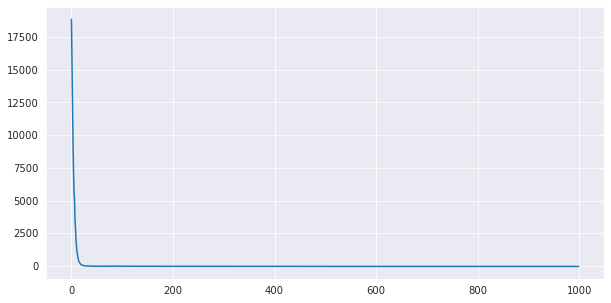

In [316]:
# monotone_activations = ["identity", "sigmoid", "tanh", "softplus"]
# monotone_activations = ["identity", "sigmoid", "softplus", "power_4", "power_2", "power_0.5", "power_0.25", "tanh_4", "tanh_1", "tanh_0.25"]
# monotone_activations = ["laplace_exact", "power_4", "power_2", "power_1", "power_0.5", "power_0.25"]
monotone_activations = ["tanh_20.0", "tanh_10.0", "tanh_1.0", "elu_20.0", "elu_10.0", "elu_1.0"]
# monotone_activations = ["power_4", "power_0.25"]
samples = {}
for act in monotone_activations:
    flow = utils_.build_cond_flow(**flow_params)
    flow, loss, loss_T = utils_.train_cond_model(flow, X=X_tensor, y=y_tensor, act=act, **train_params)
    torch.save(flow.state_dict(), f"./models/flow_T_1_{act}")
    flow.eval()
    plt.figure(figsize=(10, 5))
    plt.plot(range(len(loss)), loss, label='loss')
    plt.show()    

100%|██████████| 1000/1000 [00:00<00:00, 2295.46it/s]


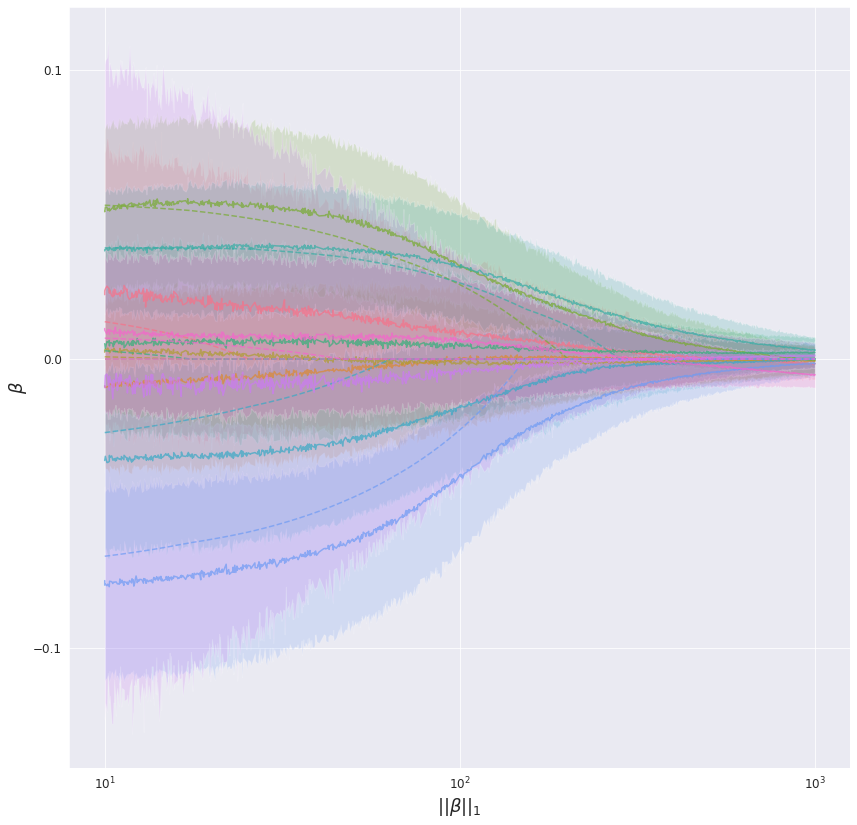

norms: min=0.0 max=0.9
min samples per bin 4


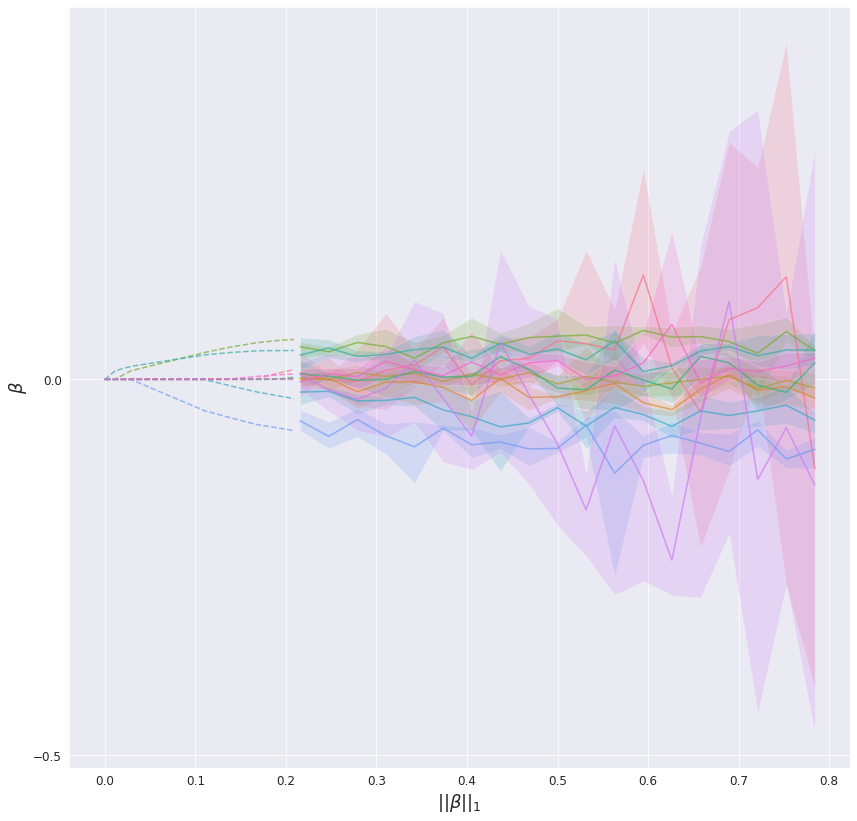

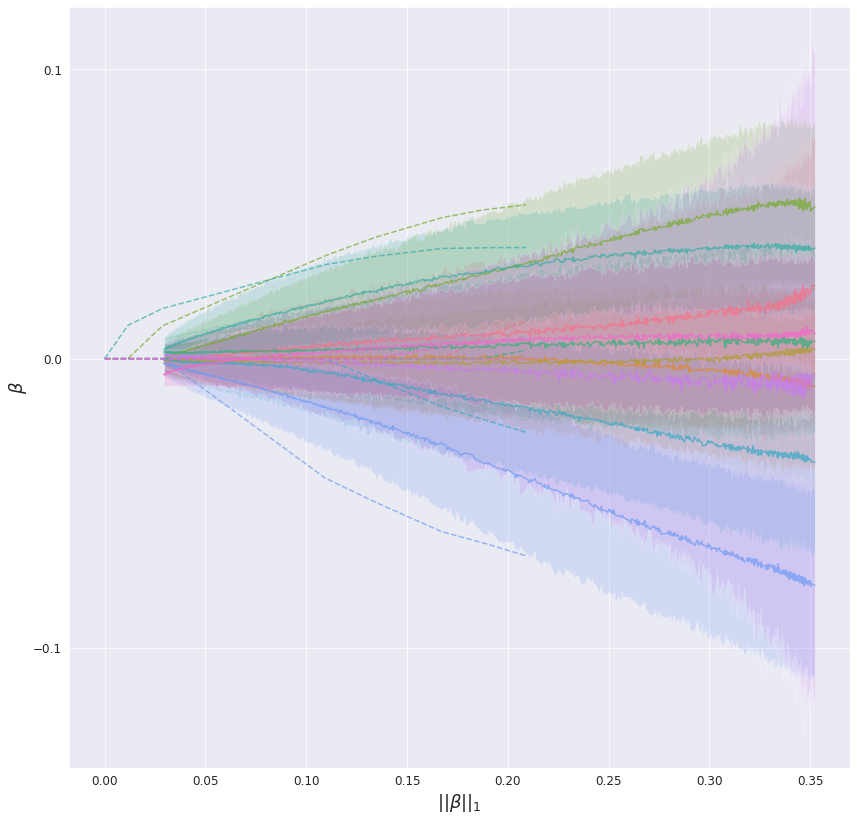

100%|██████████| 1/1 [00:00<00:00, 25.10it/s]


opt lambda:  90.96476


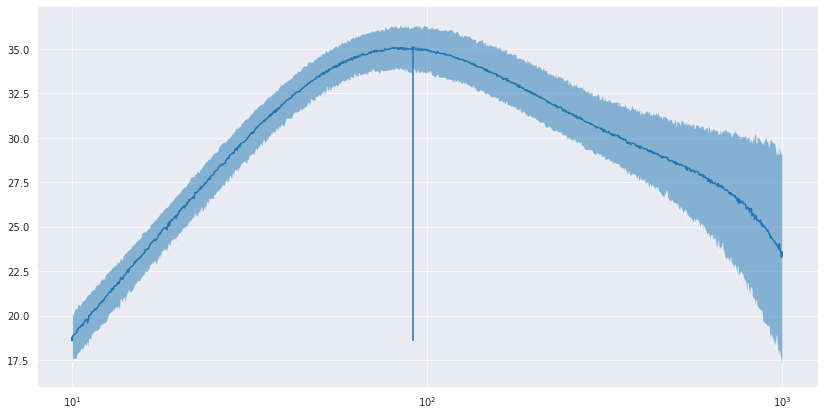

100%|██████████| 1000/1000 [00:00<00:00, 2267.12it/s]


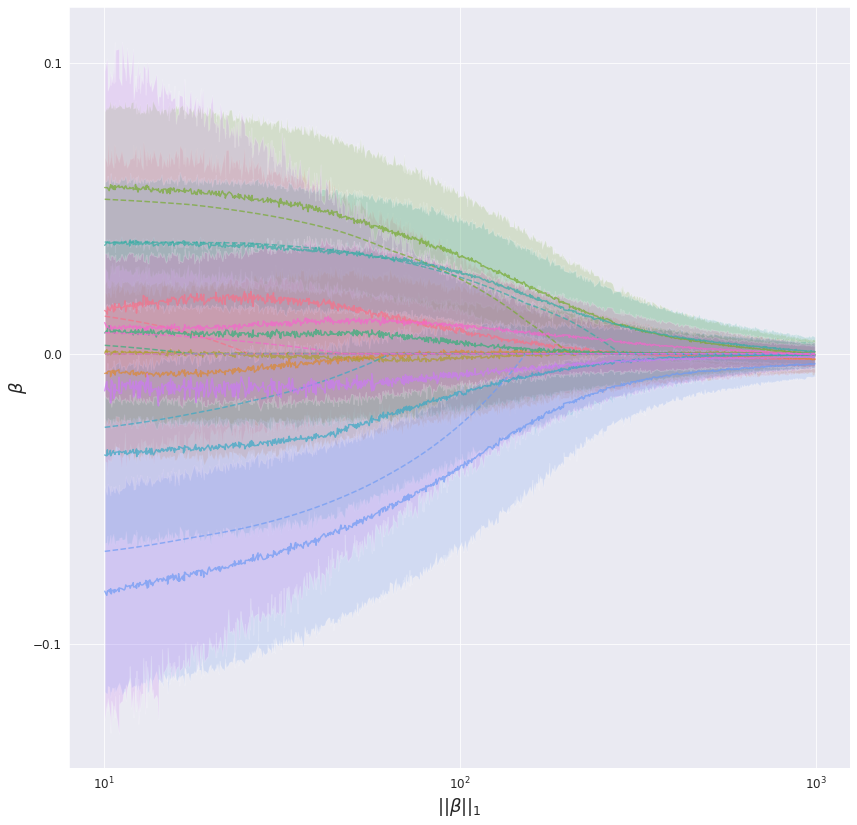

norms: min=0.0 max=1.0
min samples per bin 5


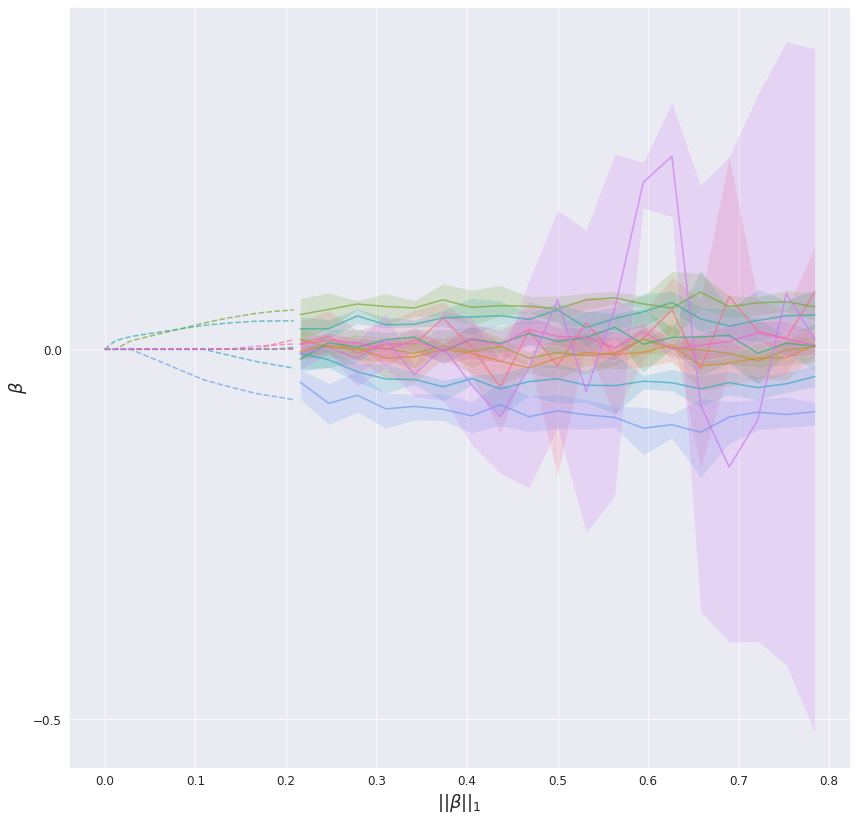

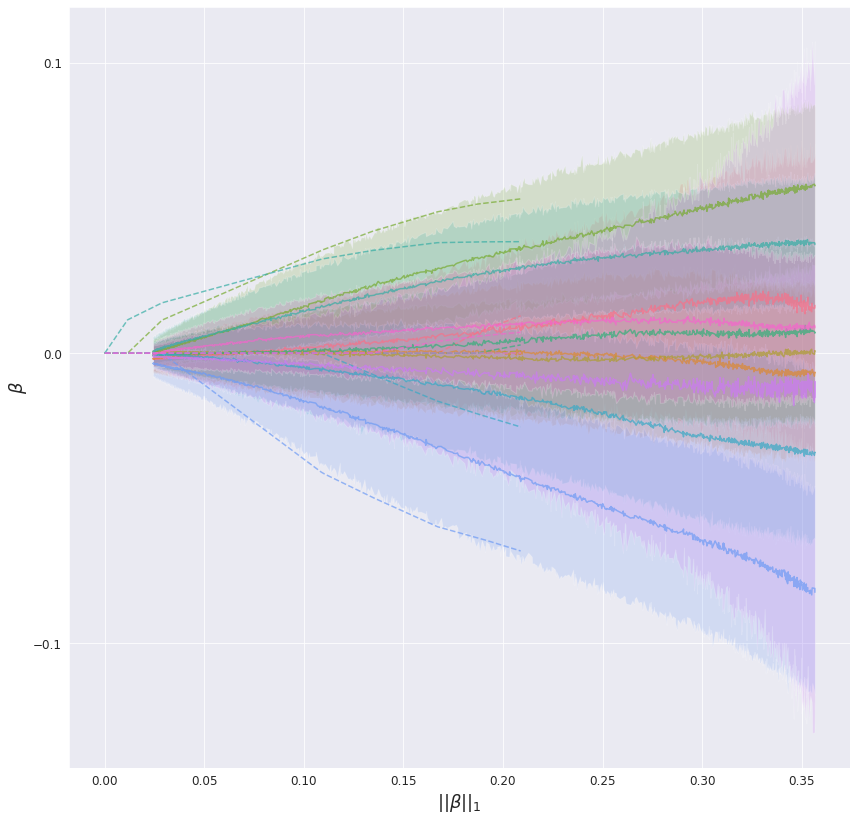

100%|██████████| 1/1 [00:00<00:00, 71.56it/s]


opt lambda:  74.57549


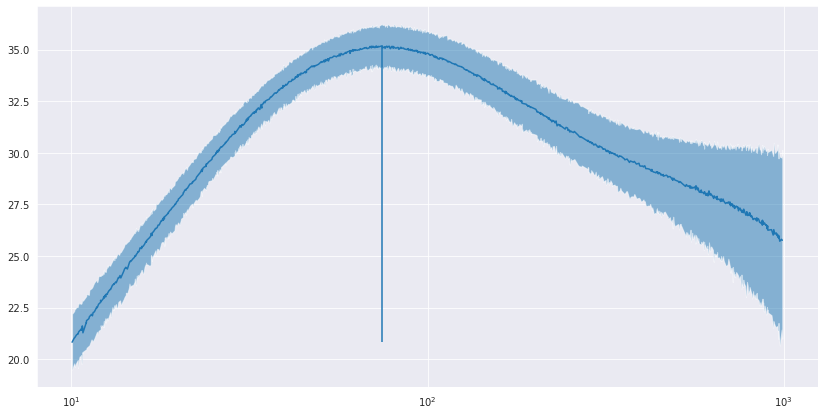

100%|██████████| 1000/1000 [00:00<00:00, 2388.53it/s]


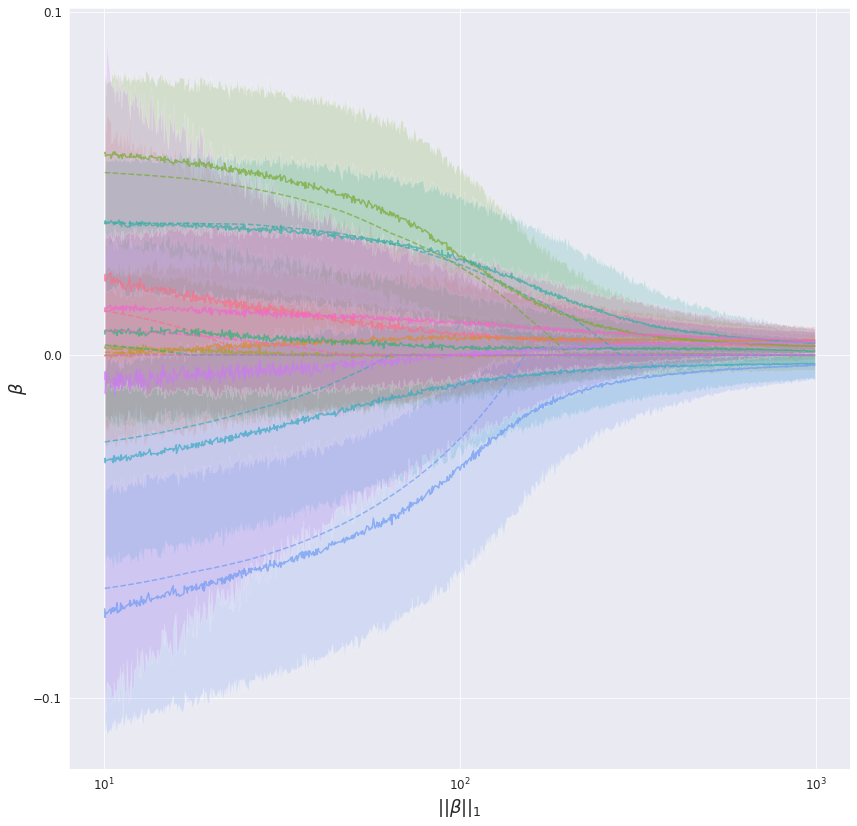

norms: min=0.0 max=1.1
min samples per bin 3


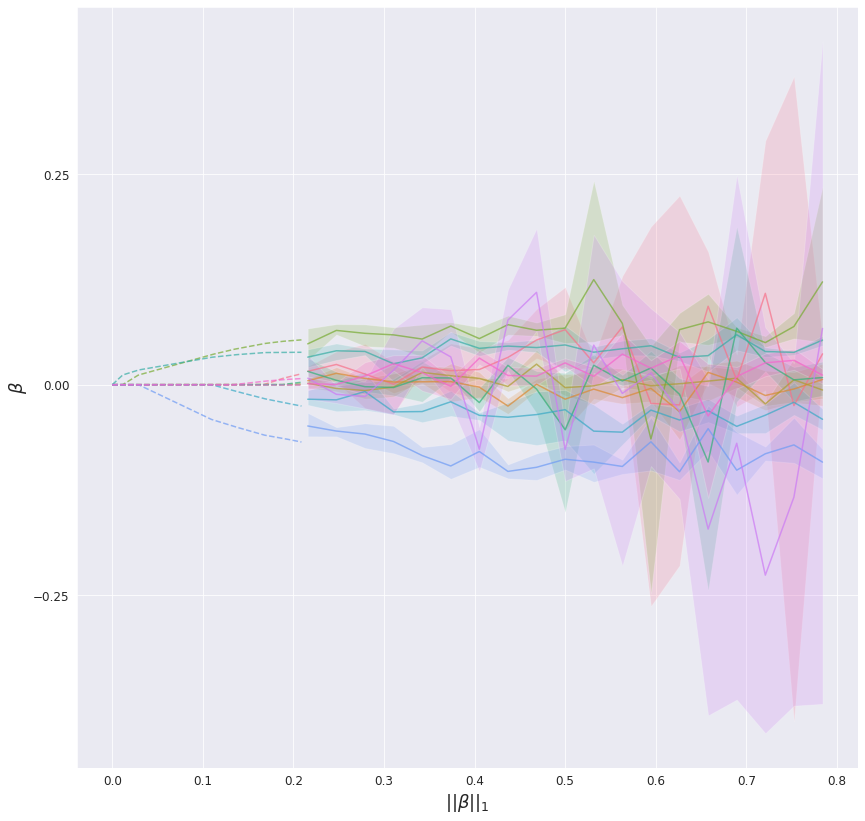

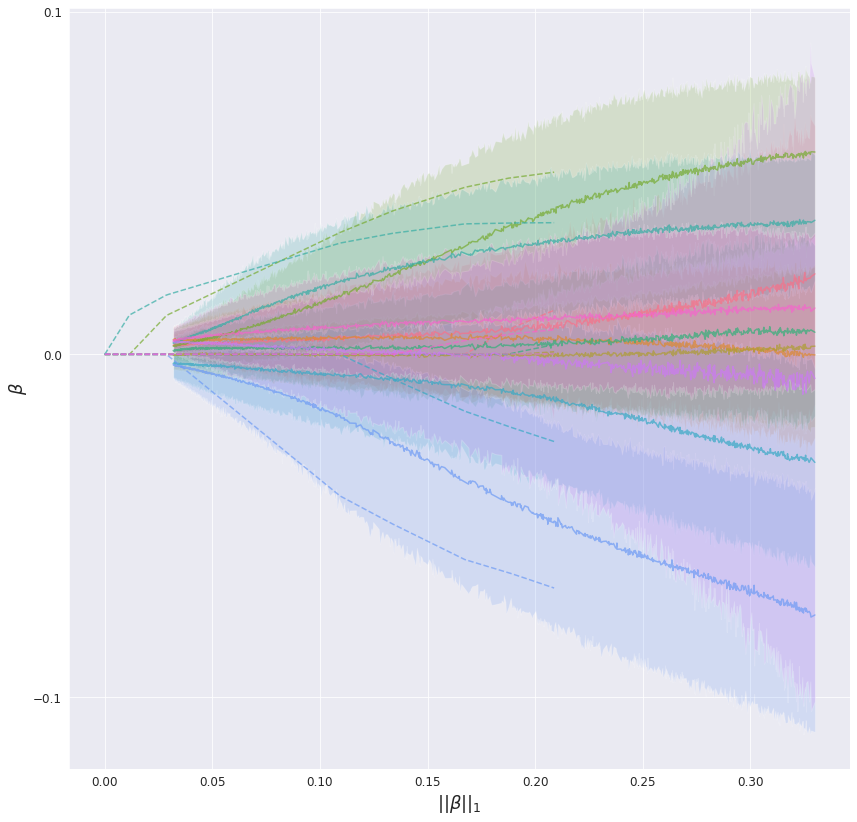

100%|██████████| 1/1 [00:00<00:00, 68.71it/s]


opt lambda:  49.745003


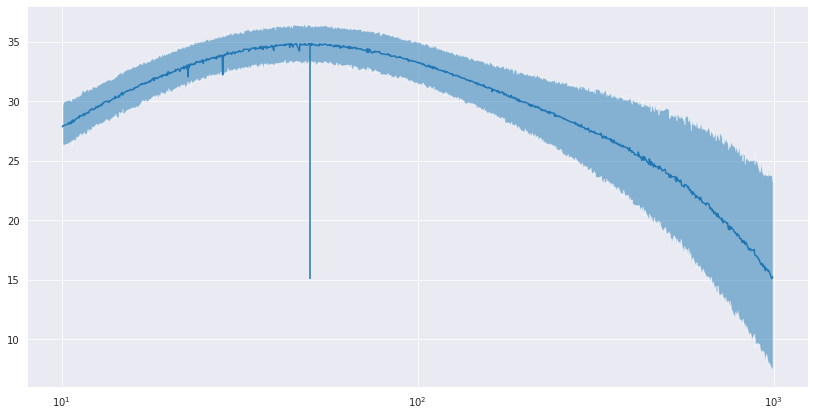

100%|██████████| 1000/1000 [00:00<00:00, 1946.86it/s]


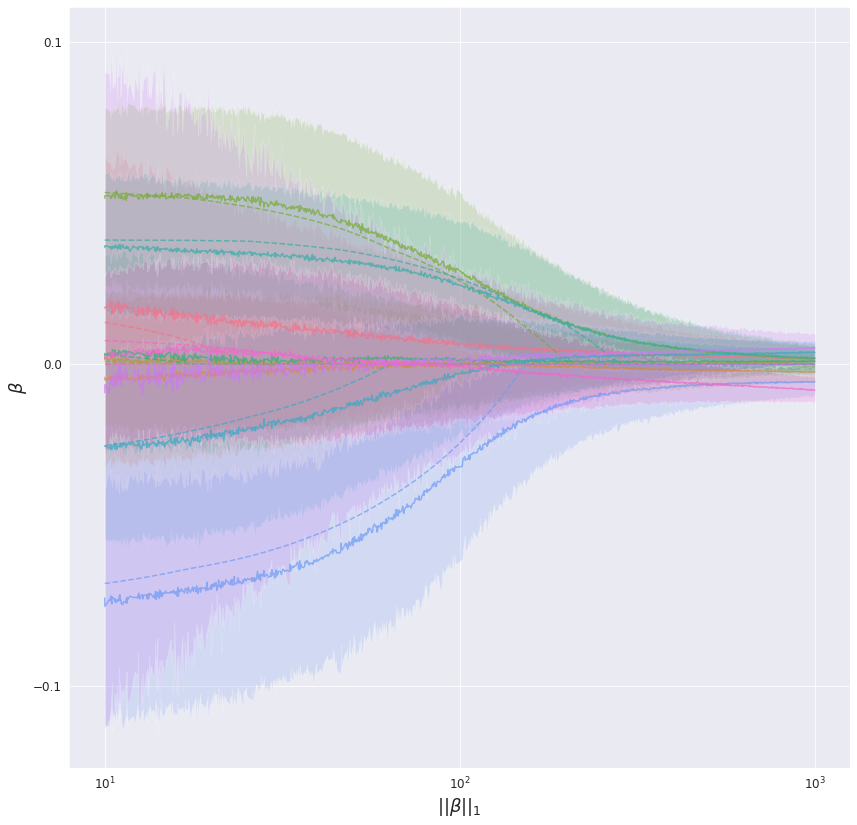

norms: min=0.0 max=1.4
min samples per bin 5


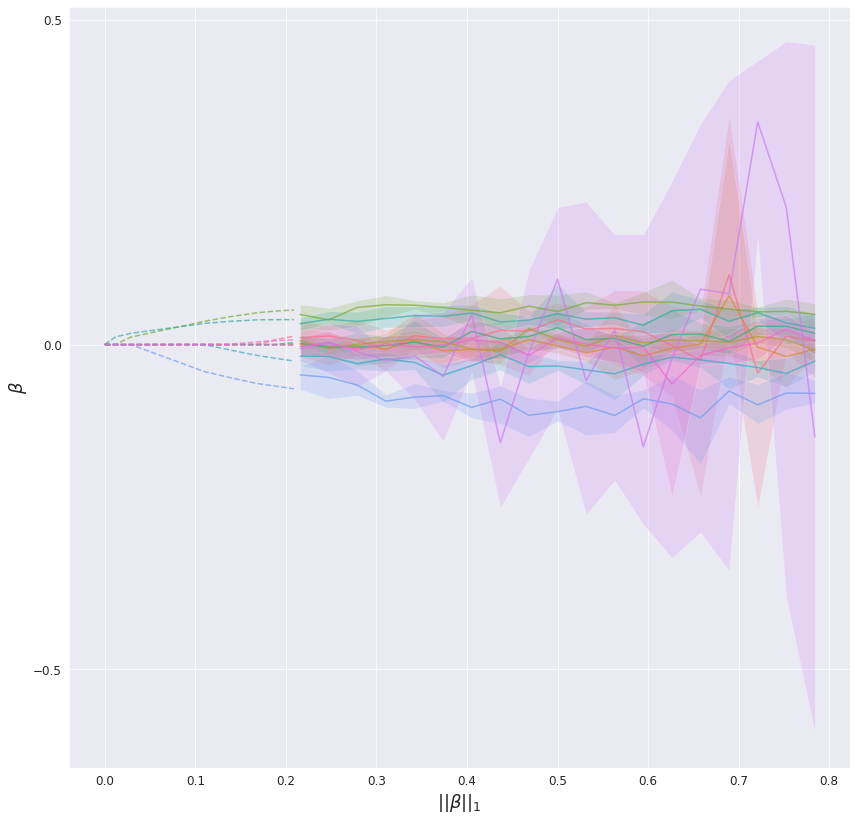

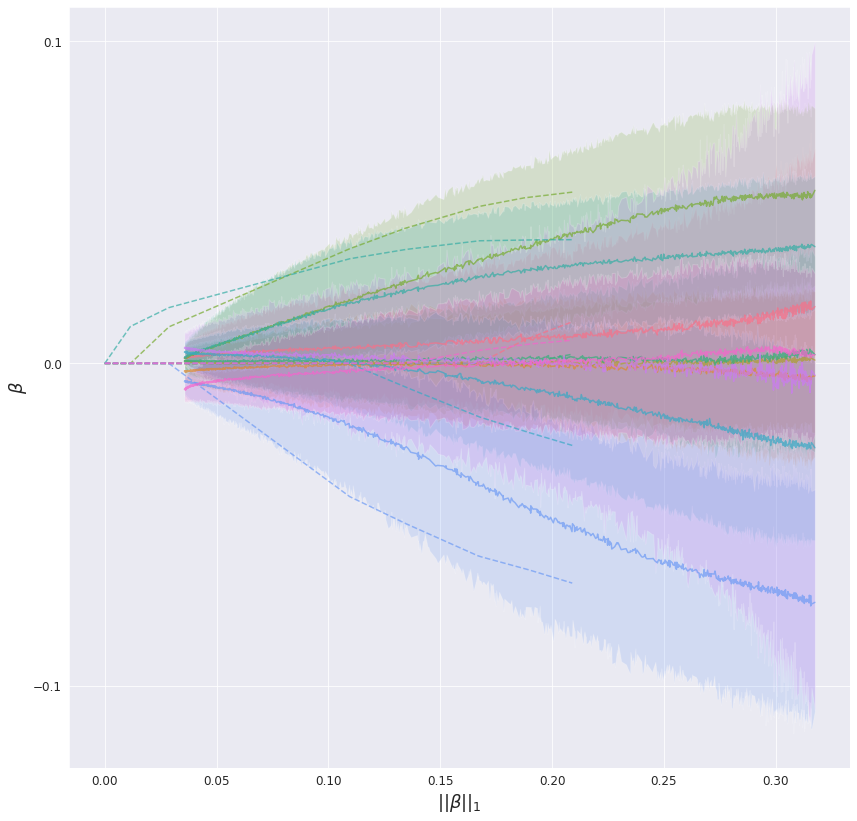

100%|██████████| 1/1 [00:00<00:00, 70.79it/s]


opt lambda:  50.106487


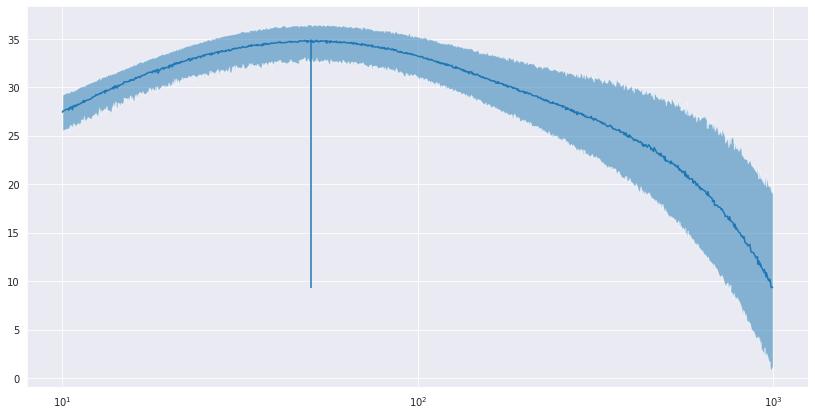

100%|██████████| 1000/1000 [00:00<00:00, 2000.60it/s]


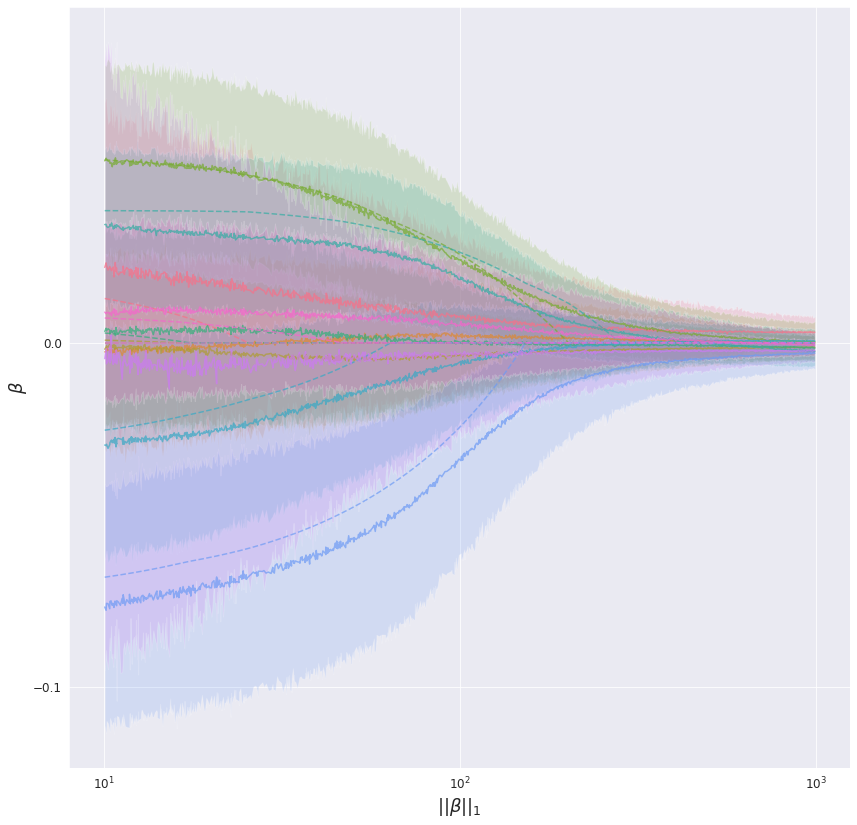

norms: min=0.0 max=1.5
min samples per bin 6


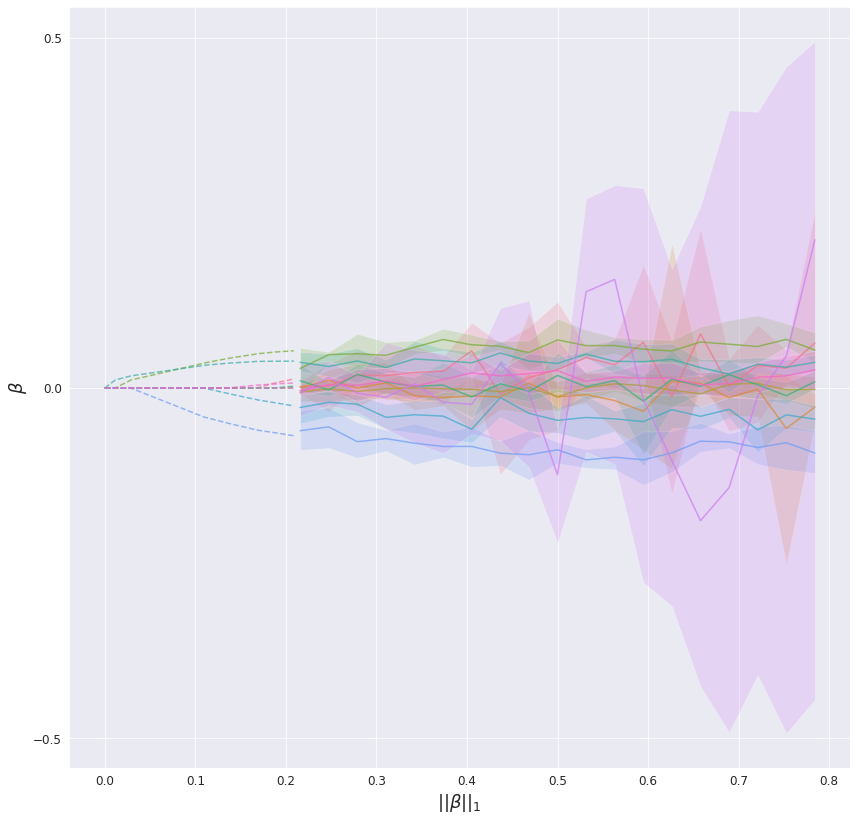

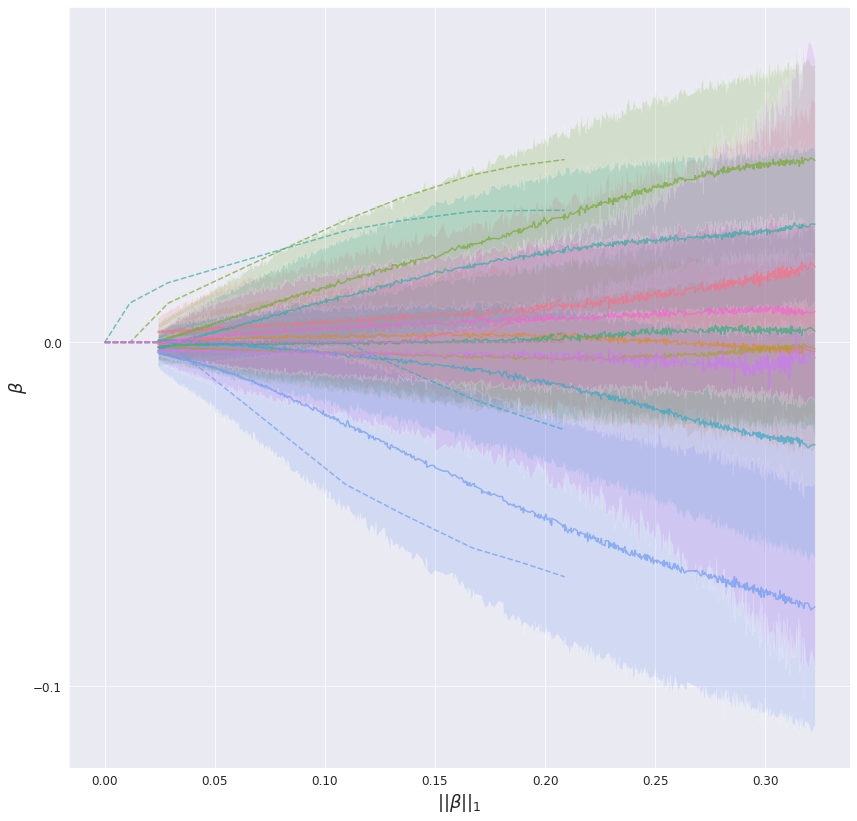

100%|██████████| 1/1 [00:00<00:00, 68.52it/s]


opt lambda:  51.719795


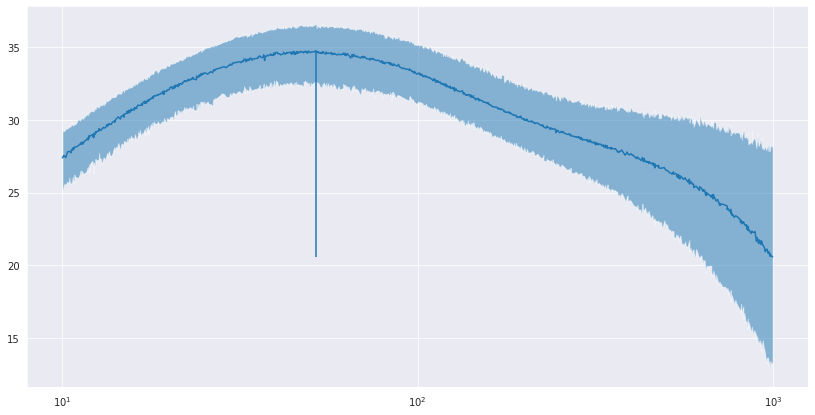

100%|██████████| 1000/1000 [00:00<00:00, 2408.19it/s]


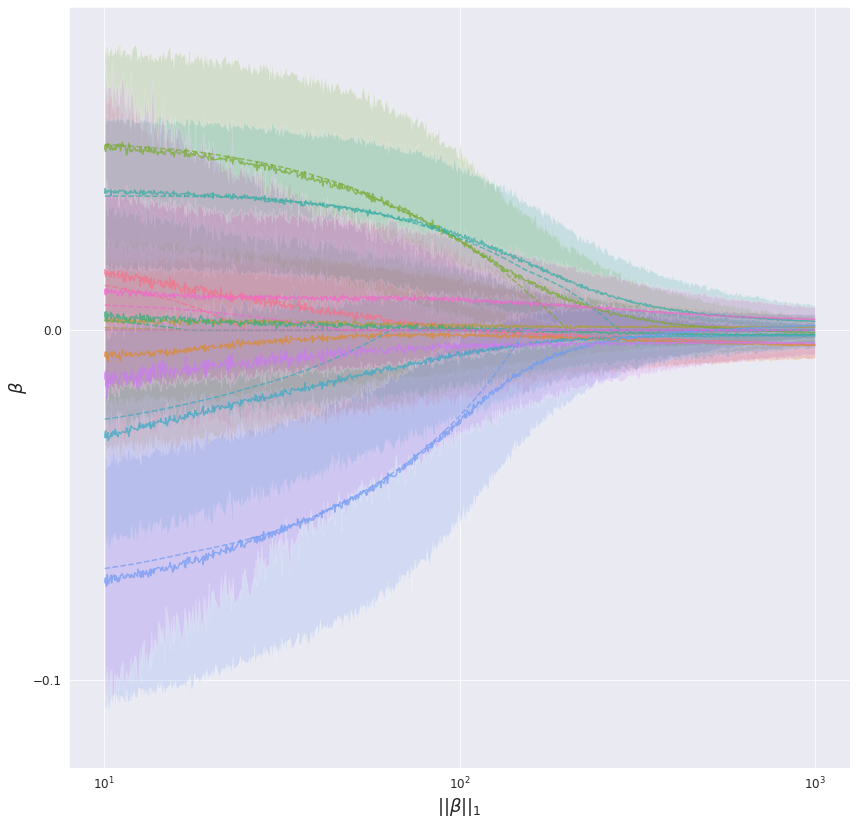

norms: min=0.0 max=1.9
min samples per bin 2


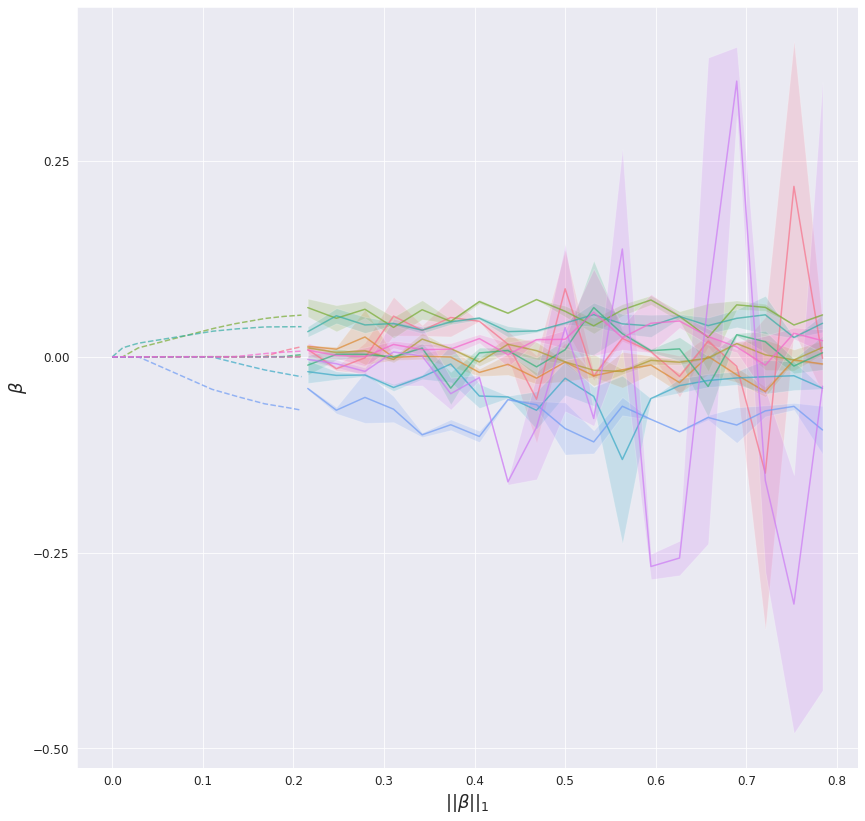

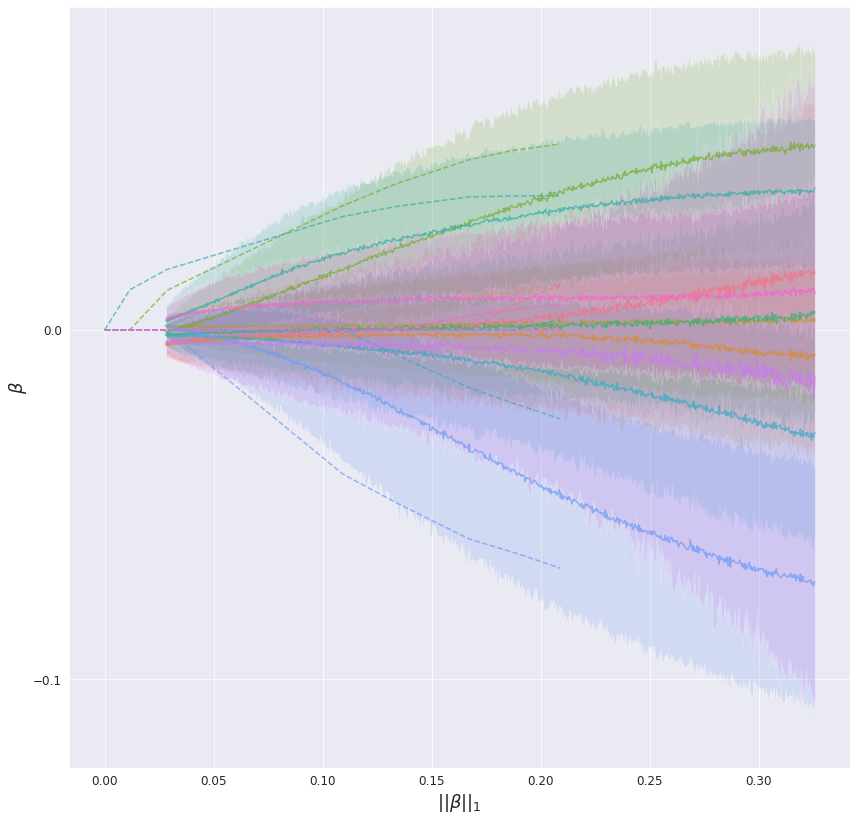

100%|██████████| 1/1 [00:00<00:00, 77.08it/s]


opt lambda:  55.60602


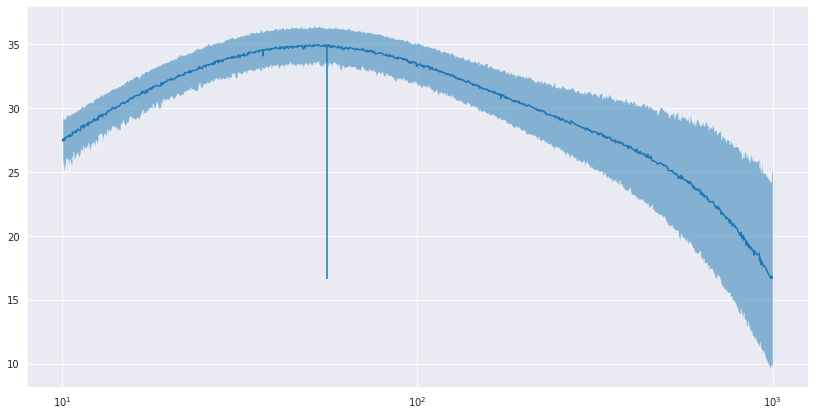

In [320]:
# monotone_activations = ["tanh_3.0_0.0", "tanh_3.0_1.0", "tanh_0.25_0.0", "power_0.5", "power_0.25", "power_4", "power_0.25"]
monotone_activations = ["tanh_20.0", "tanh_10.0", "tanh_1.0", "elu_20.0", "elu_10.0", "elu_1.0"]
opt_lambdas = {}
opt_post_samples = {}
for act in monotone_activations:
    flow = utils_.build_cond_flow(**flow_params)
    # flow = utils_.build_cond_flow(flow_dim, q=q, n_layers=5, context_features=128, hidden_features=256, device=device)
    flow.load_state_dict(torch.load(f"./models/flow_T_1_{act}"))
    samples_sorted, lambda_sorted, kl_sorted = utils_.sample_beta_exp(flow, X_tensor, y_tensor, q=train_params['q'], act=act, sigma=train_params['sigma'], lambda_min_exp=train_params['lambda_min_exp'], 
                                                         lambda_max_exp=train_params['lambda_max_exp'], context_size=1, sample_size=1000, n_iter=1000, device='cuda')
    _, _, _, _, _ = utils_.plot_betas_lambda(samples_sorted, lambda_sorted,  X_np, y_np, min_bin=0.2, max_bin=0.8, n_bins=20, sigma=train_params['sigma'], norm=train_params['q'], a=0.95, folder_name=dir_name, n_plots=1)
    opt_lambda = lambda_sorted[np.argmin(kl_sorted.mean(1))]
    opt_lambdas[act] = opt_lambda
    opt_exp_lambda = np.log10(opt_lambda)
    opt_lambda_samples, _, _ = utils_.sample_beta_exp(flow, X_tensor, y_tensor, q=train_params['q'], act=act, sigma=train_params['sigma'], lambda_min_exp=opt_exp_lambda, 
                                                      lambda_max_exp=opt_exp_lambda, context_size=1, sample_size=1000, n_iter=1, device='cuda')
    opt_post_samples[act] = opt_lambda_samples.squeeze()
    mll = -kl_sorted
    mll_mean = mll.mean(1)
    mll_l = np.quantile(mll, 0.05, axis=1)
    mll_r = np.quantile(mll, 0.95, axis=1)
    fig, ax = plt.subplots(figsize=(14,7))
    max_mll = np.argmax(mll_mean)
    print("opt lambda: ", lambda_sorted[max_mll])
    ax.plot(lambda_sorted, mll_mean)
    ax.fill_between(lambda_sorted, mll_l, mll_r, alpha=0.5)
    plt.vlines(lambda_sorted[max_mll], ymin=mll_mean.min(), ymax=mll_mean.max())
    plt.xscale('log')
    plt.show()

In [321]:
opt_lambdas

{'tanh_20.0': 90.96476,
 'tanh_10.0': 74.57549,
 'tanh_1.0': 49.745003,
 'elu_20.0': 50.106487,
 'elu_10.0': 51.719795,
 'elu_1.0': 55.60602}

Training loss at step 0: 9.3 and 23.3 * (T = 5.000)
Training loss at step 1: 7.9 and 23.0 * (T = 5.000)
Training loss at step 2: 8.5 and 23.2 * (T = 5.000)
Training loss at step 3: 7.9 and 22.8 * (T = 5.000)
Training loss at step 4: 7.2 and 22.5 * (T = 5.000)
Training loss at step 5: 6.6 and 22.6 * (T = 5.000)
Training loss at step 6: 5.7 and 22.3 * (T = 5.000)
Training loss at step 7: 5.9 and 22.3 * (T = 5.000)
Training loss at step 8: 5.1 and 22.0 * (T = 5.000)
Training loss at step 9: 5.5 and 22.0 * (T = 5.000)
Training loss at step 10: 4.2 and 21.6 * (T = 5.000)
Training loss at step 11: 3.5 and 21.3 * (T = 5.000)
Training loss at step 12: 3.0 and 21.1 * (T = 5.000)
Training loss at step 13: 2.2 and 21.1 * (T = 5.000)
Training loss at step 14: 1.6 and 20.6 * (T = 5.000)
Training loss at step 15: 0.5 and 20.2 * (T = 5.000)
Training loss at step 16: 0.7 and 20.3 * (T = 5.000)
Training loss at step 17: 0.7 and 20.3 * (T = 5.000)
Training loss at step 18: 0.3 and 20.5 * (T = 5.000)
Tra

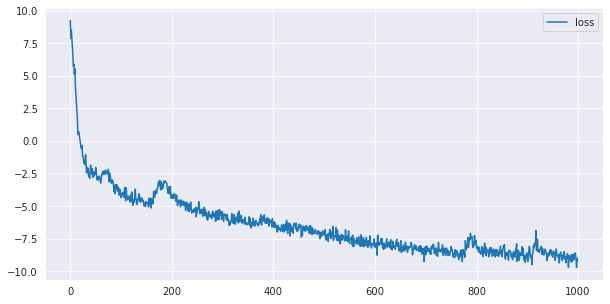

100%|██████████| 2000/2000 [00:00<00:00, 2451.18it/s]


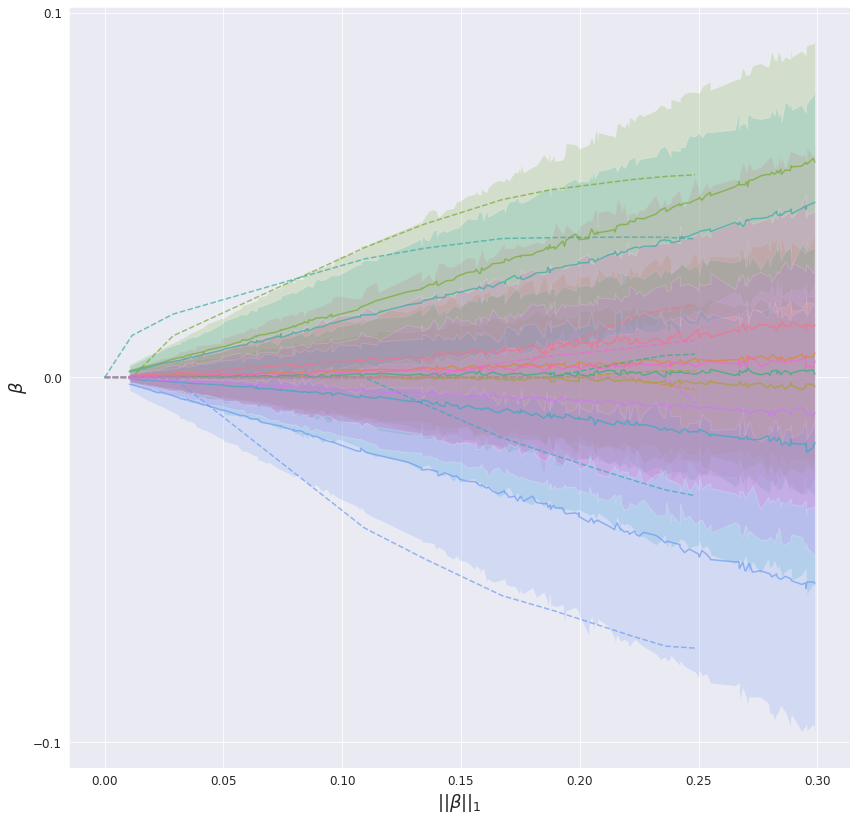

In [323]:
train_params_manifold = dict(q=q,
                             sigma=torch.tensor(.1),
                             lr=1e-4,
                             epochs=1000,
                             T0=5,
                             Tn=1,
                             iter_per_cool_step=25,
                             norm_min=0.01,
                             norm_max=.3,  #.4
                             sample_size=1,
                             context_size=1000,
                             device=device)

flow_manifold = utils_.build_cond_flow_manifold(**flow_params)
flow_manifold, loss, loss_T = utils_.train_cond_manifold_model(flow_manifold, X=X_tensor, y=y_tensor,
                                                              **train_params_manifold)
flow_manifold.eval()
plt.figure(figsize=(10, 5))
plt.plot(range(len(loss)), loss, label='loss')
plt.legend()
plt.show()
samples_sorted, norm_sorted, kl_sorted = utils_.sample_beta(flow_manifold, X_tensor, y_tensor,
                                                           sigma=train_params_manifold['sigma'],
                                                           norm_min=train_params_manifold['norm_min'],
                                                           norm_max=train_params_manifold['norm_max'], context_size=1,
                                                           sample_size=1000, n_iter=200, device='cuda')
utils_.plot_betas_norm(samples_sorted, norm_sorted, X_np, y_np, norm=train_params_manifold['q'], a=0.95, folder_name=dir_name, n_plots=1)

In [188]:
monotone_activations = ["tanh_10.0_0.0", "softplus", "laplace_approx"]

In [324]:
q = flow_params['q']
opt_post_norms = {act:np.power(np.power(np.abs(opt_post_samples[act]), q).sum(1), 1 / q) for act in monotone_activations}
mean_norms = np.array([opt_post_norms[act].mean() for act in monotone_activations])

In [325]:
norms_flow_torch = torch.from_numpy(mean_norms).to(device).to(torch.float32).view(-1,1)
manifold_samples = []
min_samples = 100
for i in tqdm.tqdm(range(10)):
    flow_manifold_samples, log_probs_samples = flow_manifold.sample_and_log_prob(opt_post_samples[monotone_activations[-1]].shape[0]//10, context=norms_flow_torch)
    manifold_samples.append(flow_manifold_samples.detach().cpu().numpy())
    del flow_manifold_samples, log_probs_samples
    torch.cuda.empty_cache()
flow_manifold_samples = np.concatenate(manifold_samples, 1)
torch.cuda.empty_cache()
flow_manifold_samples.shape

100%|██████████| 10/10 [00:00<00:00, 11.74it/s]


(6, 1000, 10)

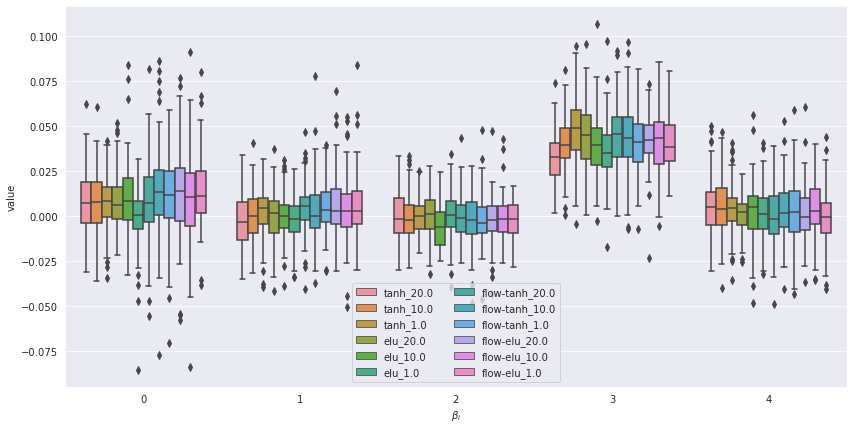

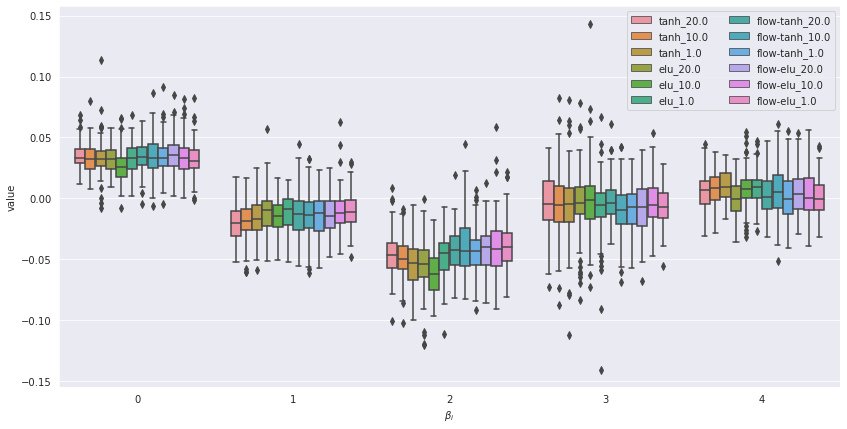

In [326]:
# plot comparison
plt.figure(figsize=(14,7))
data_frames_flow = [pd.DataFrame(opt_post_samples[act][:min_samples, :5]).assign(model=act) for act in monotone_activations]
data_frames_manifold = [pd.DataFrame(flow_manifold_samples[i][:min_samples, :5]).assign(model=f'flow-{act}') for i, act in enumerate(monotone_activations)]
data_frames = data_frames_flow + data_frames_manifold
cdf = pd.concat(data_frames)
mdf = pd.melt(cdf, id_vars=['model'], var_name=r'$\beta_i$', value_name="value")
sns.boxplot(x=r'$\beta_i$', y="value", hue="model", data=mdf, showfliers = True)
# sns.violinplot(x=r'$\beta_i$', y="value", hue="model", data=mdf)
# plt.title(r"$||\beta||_1$={:.2f}".format(mean_norms))
# plt.ylim(-3,3)
# plt.savefig(f"./plots/box_plot_norm_{mean_norms:.2f}.pdf")
plt.legend(ncol=2)
plt.show()

plt.figure(figsize=(14,7))
data_frames_flow = [pd.DataFrame(opt_post_samples[act][:min_samples,-5:]).assign(model=act) for act in monotone_activations]
data_frames_manifold = [pd.DataFrame(flow_manifold_samples[i][:min_samples,-5:]).assign(model=f'flow-{act}') for i, act in enumerate(monotone_activations)]
data_frames = data_frames_flow + data_frames_manifold
cdf = pd.concat(data_frames)
mdf = pd.melt(cdf, id_vars=['model'], var_name=r'$\beta_i$', value_name="value")
sns.boxplot(x=r'$\beta_i$', y="value", hue="model", data=mdf, showfliers = True)
# sns.violinplot(x=r'$\beta_i$', y="value", hue="model", data=mdf)
# plt.title(r"$||\beta||_1$={:.2f}".format(mean_norms))
# plt.ylim(-3,3)
# plt.savefig(f"./plots/box_plot_norm_{mean_norms:.2f}.pdf")
plt.legend(ncol=2)
plt.show()

In [27]:
opt_lambdas

{'tanh_5.0_0.0': 31.315838,
 'tanh_5.0_5.0': 31.099081,
 'tanh_3.0_0.0': 31.288254,
 'tanh_3.0_3.0': 29.24482,
 'tanh_0.25_0.0': 31.03526,
 'power_0.5': 31.56119,
 'power_0.25': 31.283566}

In [13]:
samples_sorted, lambda_sorted, kl_sorted = utils_.sample_beta_exp(flow, X_tensor, y_tensor, sigma=params_flow['sigma'], lambda_min_exp=params_flow['lambda_min_exp'], 
                                                     lambda_max_exp=params_flow['lambda_max_exp'], context_size=1, sample_size=100, n_iter=1000, device='cuda')

100%|██████████| 1000/1000 [00:12<00:00, 82.89it/s]


100%|██████████| 1000/1000 [00:01<00:00, 983.05it/s]


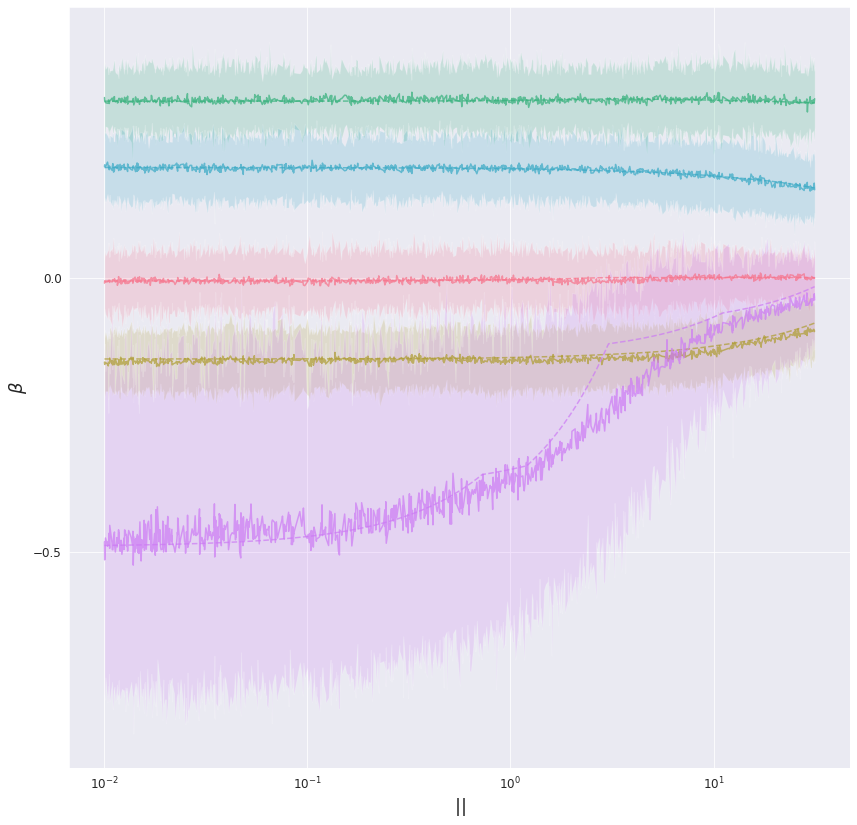

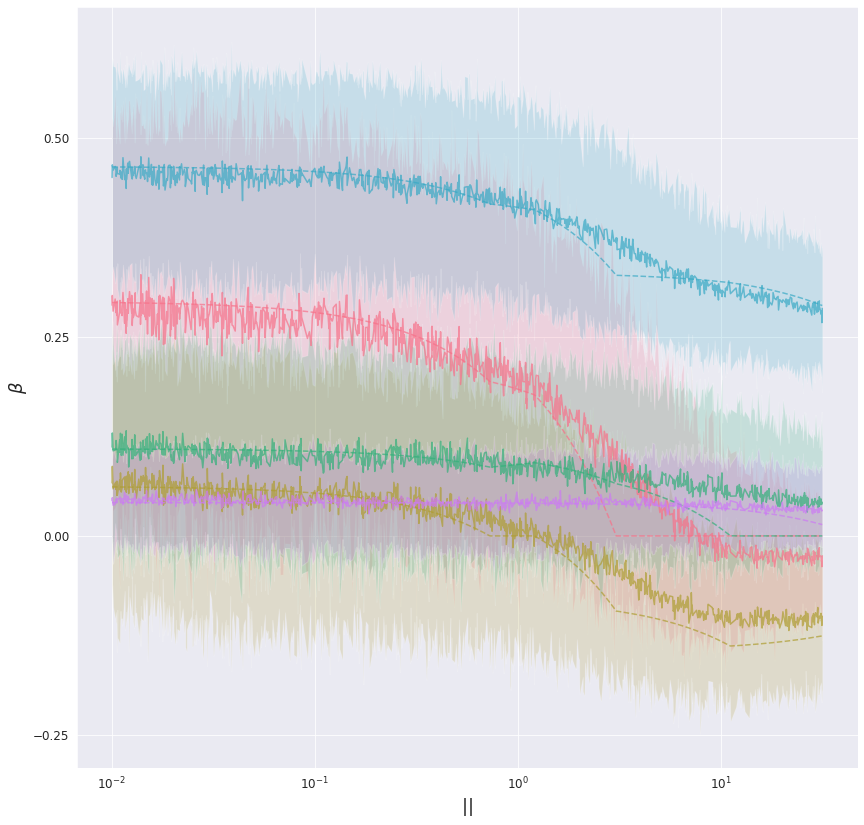

0.84558576 3.9158025
[  17   67  199  444  940 1516 2143 2500 3246 3675 4009 3936 3819 3592
 3247 2951 2758 2598 2591 2591 2510 2525 2520 2536 2550 2481 2365 2336
 2271 2179 2129 2073 2041 1938 1874 1843 1702 1752 1576 1456 1379 1232
 1162 1044  950  851  748  659  565  447]


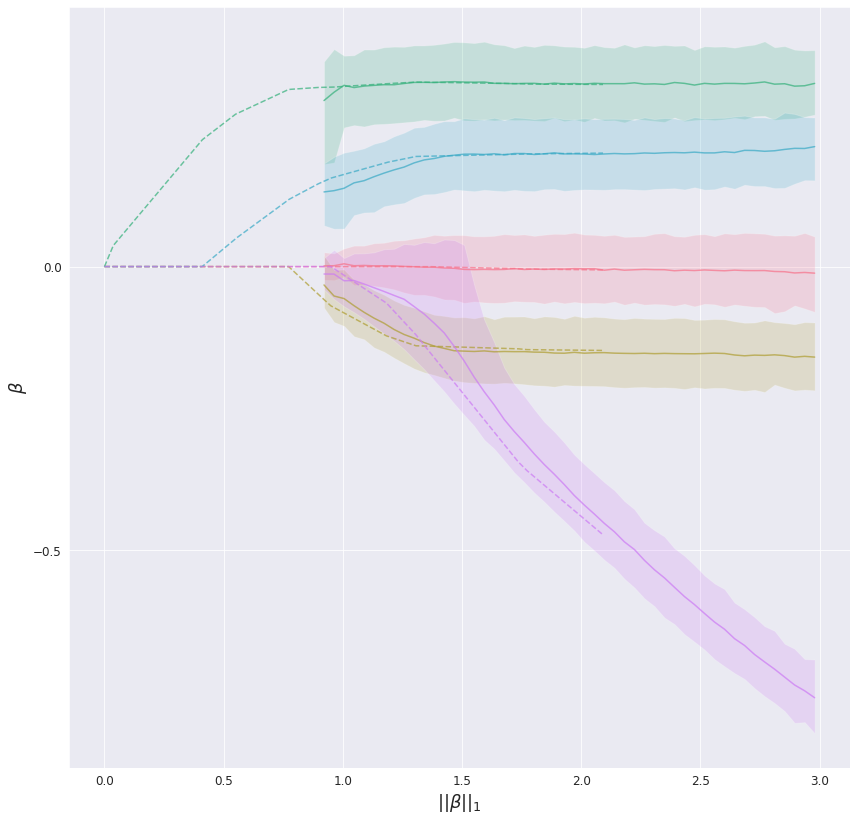

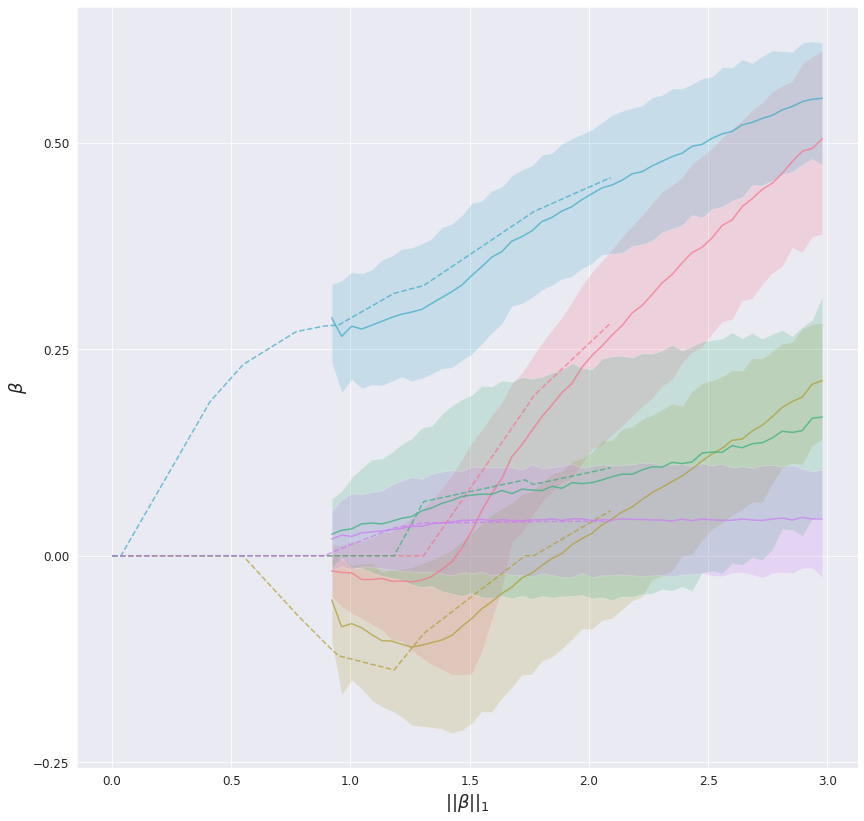

/home/negri0001/Documents/Marcello/cond_flows/manifold_flow/utils.py:437: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  samples_norm = np.array([all_samples[digitized == i][:min_n_per_bin] for i in range(1, len(bins))])


In [14]:
bins, samples_flow, l_flow, means_flow, r_flow = utils_.plot_betas_lambda(samples_sorted, lambda_sorted,  X_np, y_np, sigma=params_flow['sigma'], norm=params_flow['q'], a=0.95, folder_name=dir_name, n_plots=2)

100%|██████████| 1000/1000 [00:01<00:00, 950.46it/s]


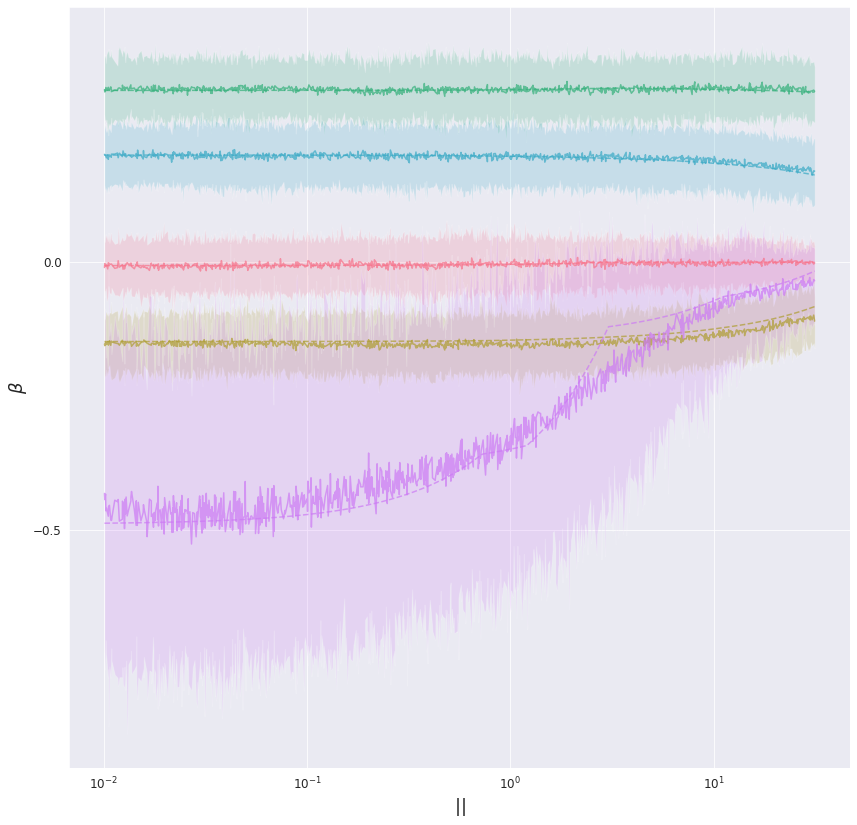

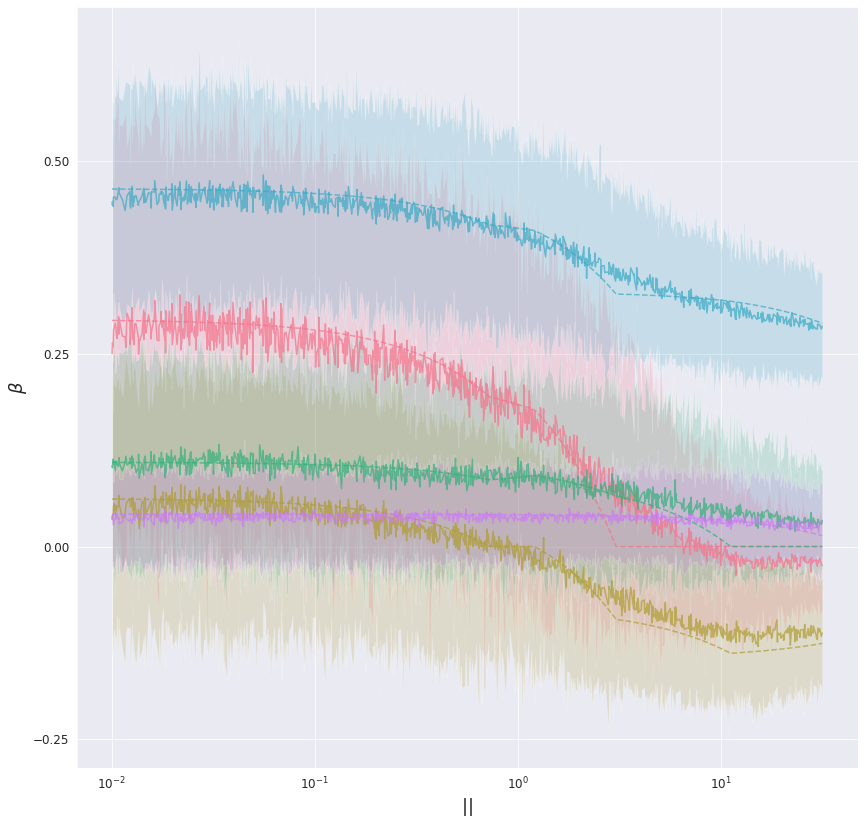

0.8750736 4.683648
[   7   55  169  392  862 1409 2260 2921 3501 4131 4212 4181 4143 3738
 3376 3145 2766 2712 2760 2528 2495 2484 2428 2451 2349 2275 2335 2291
 2200 2178 2100 2086 1983 1938 1788 1755 1680 1564 1487 1348 1260 1088
  952  910  789  725  606  524  416  375]


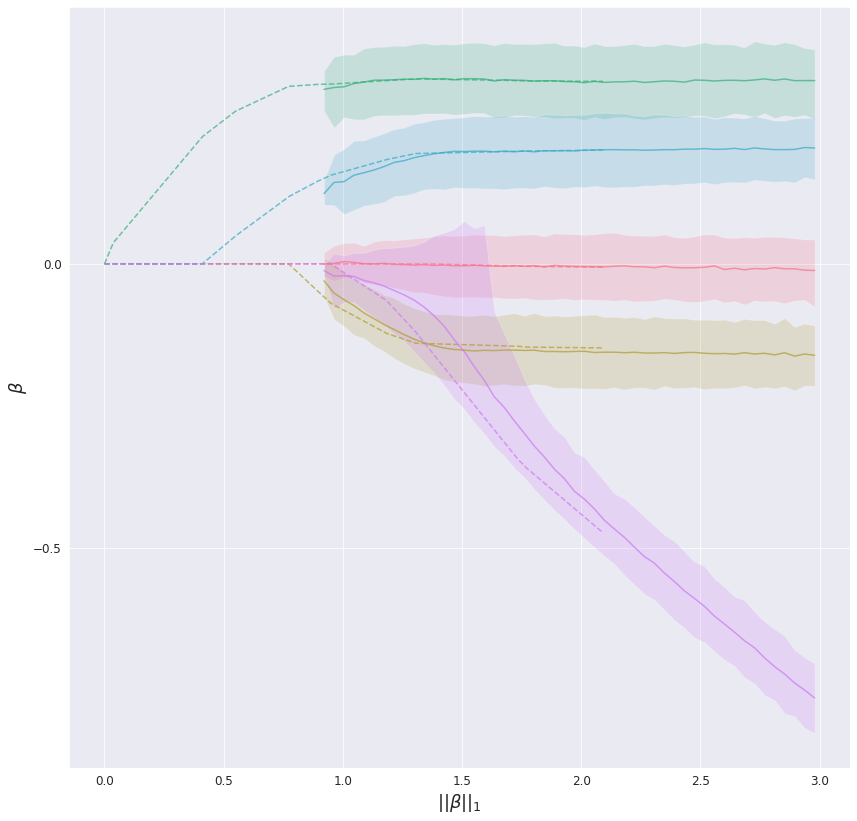

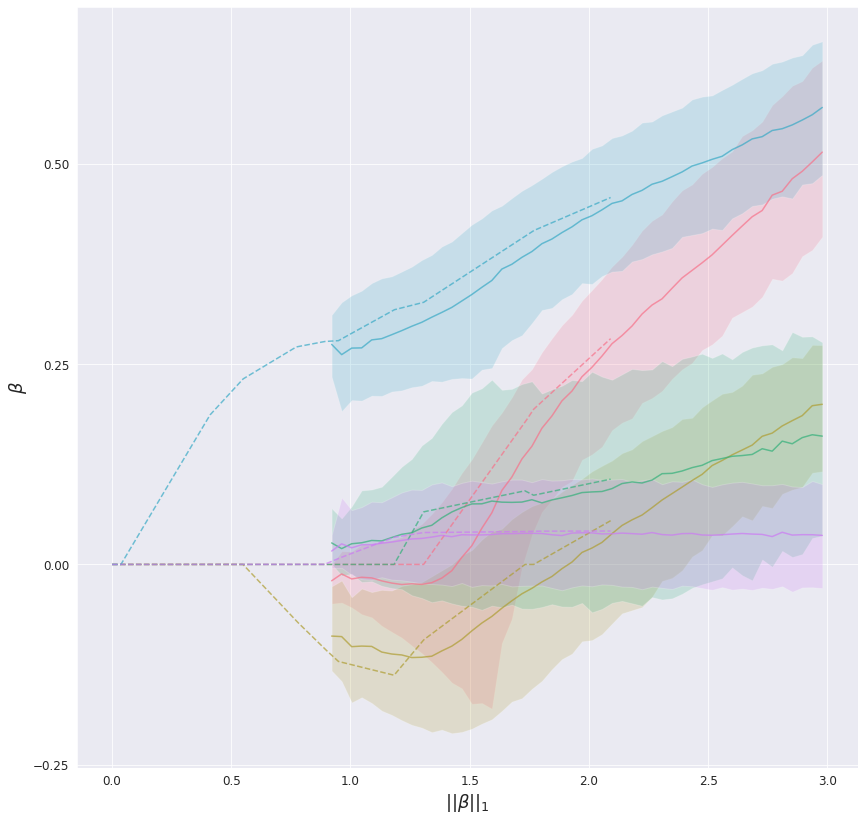

/home/negri0001/Documents/Marcello/cond_flows/manifold_flow/utils.py:437: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  samples_norm = np.array([all_samples[digitized == i][:min_n_per_bin] for i in range(1, len(bins))])


In [10]:
bins, samples_flow, l_flow, means_flow, r_flow = utils_.plot_betas_lambda(samples_sorted, lambda_sorted,  X_np, y_np, sigma=params_flow['sigma'], norm=params_flow['q'], a=0.95, folder_name=dir_name, n_plots=2)

### Sample from Bayes Lasso

In [16]:
data_df = pd.DataFrame(np.c_[y_np,X_np], 
                       columns = ['target','0','1','2','3','4','5','6','7','8','9'])

Training loss at step 0: 6046.3 and 592.6 * (T = 10.000)
Training loss at step 1: 5570.4 and 545.3 * (T = 10.000)
Training loss at step 2: 4857.2 and 474.6 * (T = 10.000)
Training loss at step 3: 4593.4 and 448.7 * (T = 10.000)
Training loss at step 4: 4163.4 and 406.2 * (T = 10.000)
Training loss at step 5: 3656.8 and 356.3 * (T = 10.000)
Training loss at step 6: 3352.9 and 326.4 * (T = 10.000)
Training loss at step 7: 2899.0 and 281.8 * (T = 10.000)
Training loss at step 8: 2498.9 and 242.8 * (T = 10.000)
Training loss at step 9: 2300.4 and 223.9 * (T = 10.000)
Training loss at step 10: 2105.1 and 205.1 * (T = 10.000)
Training loss at step 11: 1858.4 and 181.5 * (T = 10.000)
Training loss at step 12: 1676.5 and 164.4 * (T = 10.000)
Training loss at step 13: 1509.8 and 149.0 * (T = 10.000)
Training loss at step 14: 1368.5 and 136.1 * (T = 10.000)
Training loss at step 15: 1172.7 and 118.6 * (T = 10.000)
Training loss at step 16: 1092.5 and 112.1 * (T = 10.000)
Training loss at step 17

100%|██████████| 1000/1000 [00:11<00:00, 84.05it/s]


Training loss at step 0: 6699.5 and 658.0 * (T = 10.000)
Training loss at step 1: 5932.9 and 581.8 * (T = 10.000)
Training loss at step 2: 5368.3 and 525.7 * (T = 10.000)
Training loss at step 3: 4937.5 and 483.3 * (T = 10.000)
Training loss at step 4: 4364.3 and 426.5 * (T = 10.000)
Training loss at step 5: 3989.8 and 389.7 * (T = 10.000)
Training loss at step 6: 3588.6 and 350.2 * (T = 10.000)
Training loss at step 7: 3106.0 and 302.7 * (T = 10.000)
Training loss at step 8: 2875.9 and 280.7 * (T = 10.000)
Training loss at step 9: 2662.2 and 260.3 * (T = 10.000)
Training loss at step 10: 2264.8 and 221.8 * (T = 10.000)
Training loss at step 11: 2059.7 and 202.4 * (T = 10.000)
Training loss at step 12: 1878.4 and 185.0 * (T = 10.000)
Training loss at step 13: 1666.9 and 165.4 * (T = 10.000)
Training loss at step 14: 1517.0 and 151.7 * (T = 10.000)
Training loss at step 15: 1373.4 and 138.4 * (T = 10.000)
Training loss at step 16: 1212.1 and 124.3 * (T = 10.000)
Training loss at step 17

100%|██████████| 1000/1000 [00:12<00:00, 82.93it/s]


Training loss at step 0: 7229.1 and 711.3 * (T = 10.000)
Training loss at step 1: 6787.1 and 667.6 * (T = 10.000)
Training loss at step 2: 6251.5 and 614.3 * (T = 10.000)
Training loss at step 3: 5685.0 and 558.2 * (T = 10.000)
Training loss at step 4: 5018.5 and 492.1 * (T = 10.000)
Training loss at step 5: 4456.3 and 436.4 * (T = 10.000)
Training loss at step 6: 4273.3 and 418.8 * (T = 10.000)
Training loss at step 7: 3772.3 and 369.5 * (T = 10.000)
Training loss at step 8: 3639.7 and 357.0 * (T = 10.000)
Training loss at step 9: 3217.4 and 315.8 * (T = 10.000)
Training loss at step 10: 2837.3 and 279.0 * (T = 10.000)
Training loss at step 11: 2613.0 and 257.5 * (T = 10.000)
Training loss at step 12: 2380.5 and 235.4 * (T = 10.000)
Training loss at step 13: 2147.3 and 213.2 * (T = 10.000)
Training loss at step 14: 2032.6 and 202.9 * (T = 10.000)
Training loss at step 15: 1911.2 and 192.0 * (T = 10.000)
Training loss at step 16: 1726.7 and 174.9 * (T = 10.000)
Training loss at step 17

100%|██████████| 1000/1000 [00:11<00:00, 84.44it/s]


Training loss at step 0: 7793.9 and 767.2 * (T = 10.000)
Training loss at step 1: 7124.7 and 700.8 * (T = 10.000)
Training loss at step 2: 6853.8 and 674.2 * (T = 10.000)
Training loss at step 3: 6018.5 and 591.2 * (T = 10.000)
Training loss at step 4: 5347.3 and 524.6 * (T = 10.000)
Training loss at step 5: 4637.4 and 454.3 * (T = 10.000)
Training loss at step 6: 4304.6 and 421.9 * (T = 10.000)
Training loss at step 7: 3738.0 and 366.1 * (T = 10.000)
Training loss at step 8: 3345.5 and 327.8 * (T = 10.000)
Training loss at step 9: 2841.8 and 278.3 * (T = 10.000)
Training loss at step 10: 2360.6 and 231.9 * (T = 10.000)
Training loss at step 11: 2148.6 and 211.5 * (T = 10.000)
Training loss at step 12: 1874.9 and 185.7 * (T = 10.000)
Training loss at step 13: 1645.0 and 164.6 * (T = 10.000)
Training loss at step 14: 1432.2 and 144.1 * (T = 10.000)
Training loss at step 15: 1238.9 and 127.1 * (T = 10.000)
Training loss at step 16: 1127.7 and 117.7 * (T = 10.000)
Training loss at step 17

100%|██████████| 1000/1000 [00:13<00:00, 76.74it/s]


Training loss at step 0: 8398.3 and 827.8 * (T = 10.000)
Training loss at step 1: 7914.2 and 779.9 * (T = 10.000)
Training loss at step 2: 7234.8 and 712.4 * (T = 10.000)
Training loss at step 3: 6263.7 and 615.9 * (T = 10.000)
Training loss at step 4: 5674.5 and 557.6 * (T = 10.000)
Training loss at step 5: 5064.8 and 497.3 * (T = 10.000)
Training loss at step 6: 4292.5 and 420.8 * (T = 10.000)
Training loss at step 7: 4143.7 and 406.8 * (T = 10.000)
Training loss at step 8: 3569.4 and 350.5 * (T = 10.000)
Training loss at step 9: 3004.9 and 295.1 * (T = 10.000)
Training loss at step 10: 2710.6 and 266.6 * (T = 10.000)
Training loss at step 11: 2341.7 and 231.5 * (T = 10.000)
Training loss at step 12: 2070.7 and 205.7 * (T = 10.000)
Training loss at step 13: 1811.3 and 180.8 * (T = 10.000)
Training loss at step 14: 1557.3 and 157.0 * (T = 10.000)
Training loss at step 15: 1448.7 and 147.9 * (T = 10.000)
Training loss at step 16: 1309.1 and 135.7 * (T = 10.000)
Training loss at step 17

100%|██████████| 1000/1000 [00:13<00:00, 73.72it/s]


In [7]:
# Defining the R script and loading the instance in Python
r = robjects.r
r['source']('bayes_lasso.R')# Loading the function we have defined in R.
bayes_function = robjects.globalenv['bayes_function']# Reading and processing data
bayes_function_opt_alpha  = (robjects.globalenv)['bayes_function_opt_alpha']# Reading and processing data

100%|██████████| 1000/1000 [00:12<00:00, 81.62it/s]


100%|██████████| 1000/1000 [00:00<00:00, 1451.71it/s]


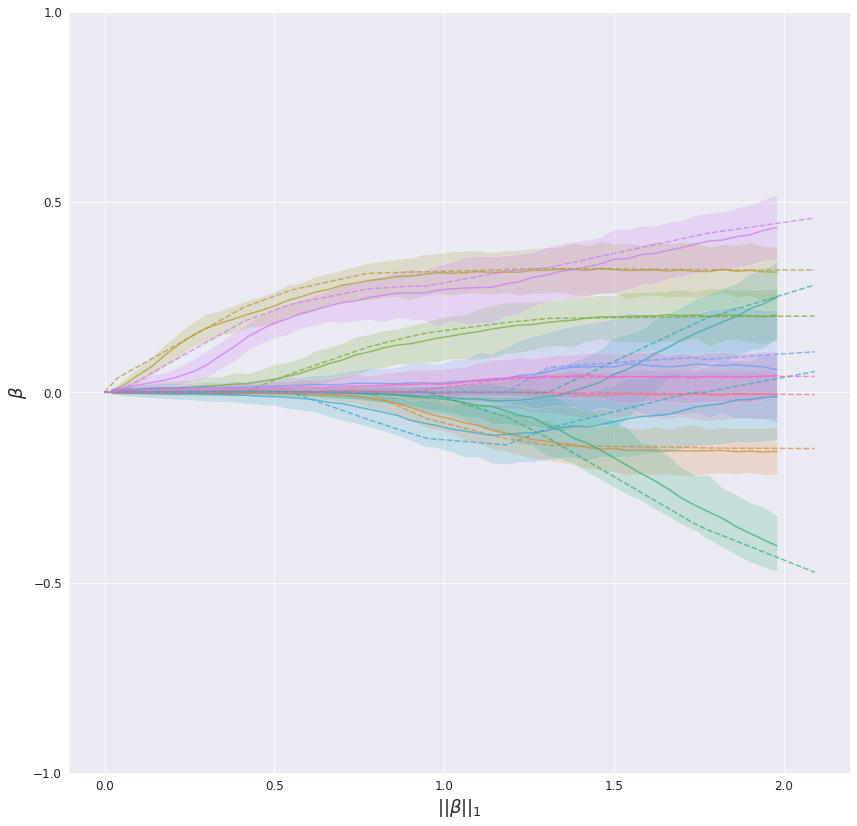

100%|██████████| 1000/1000 [00:00<00:00, 1431.73it/s]


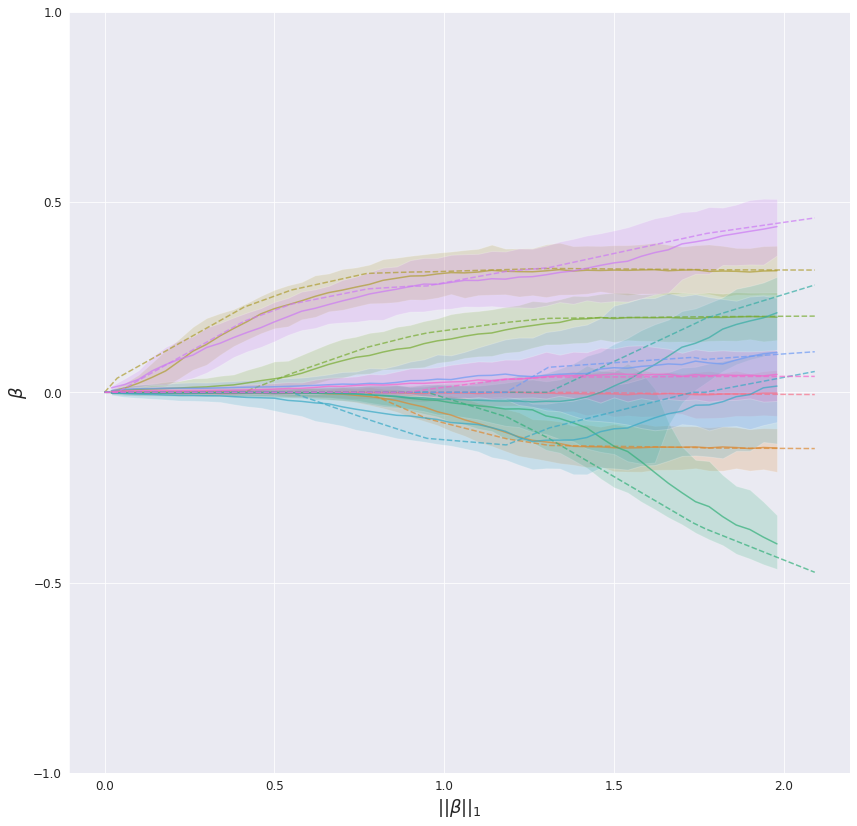

100%|██████████| 1000/1000 [00:00<00:00, 1364.69it/s]


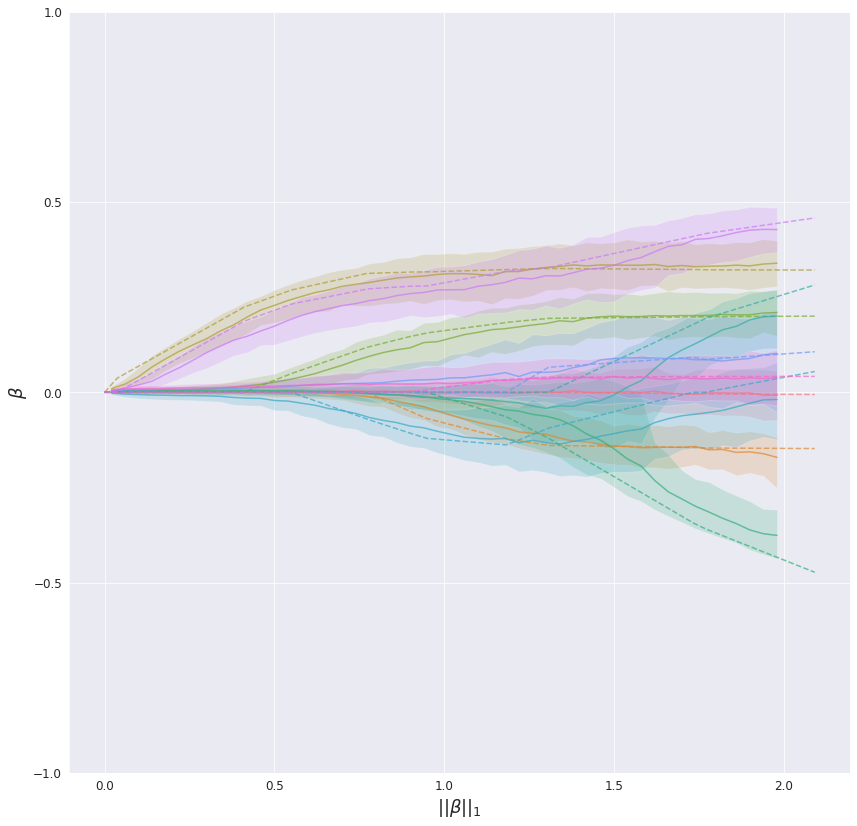

100%|██████████| 1000/1000 [00:00<00:00, 1396.30it/s]


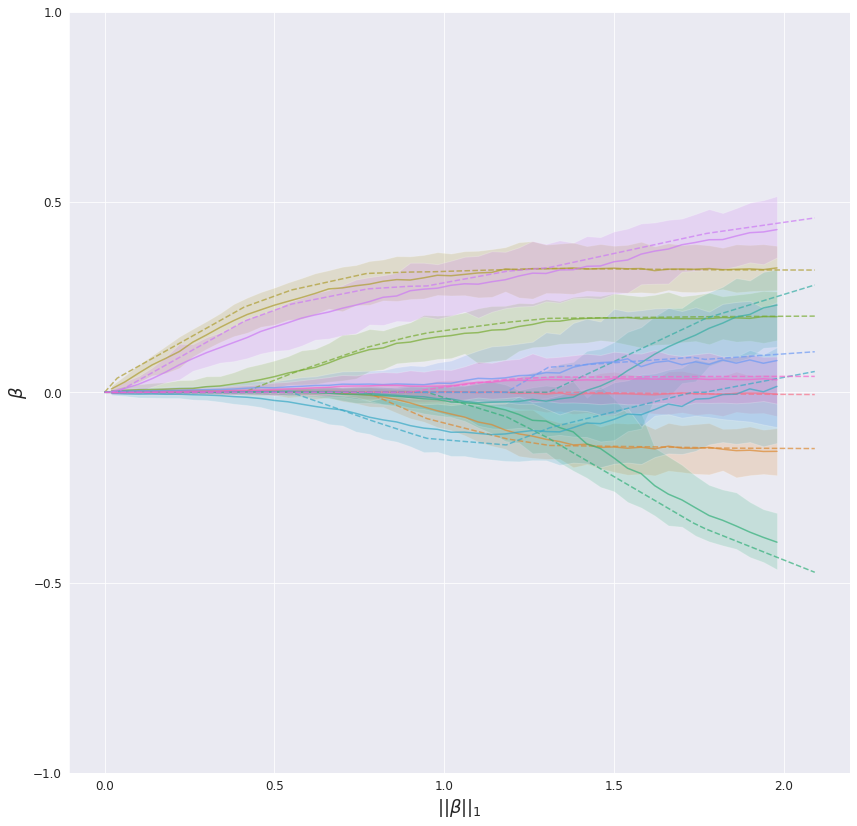

100%|██████████| 1000/1000 [00:00<00:00, 1291.95it/s]


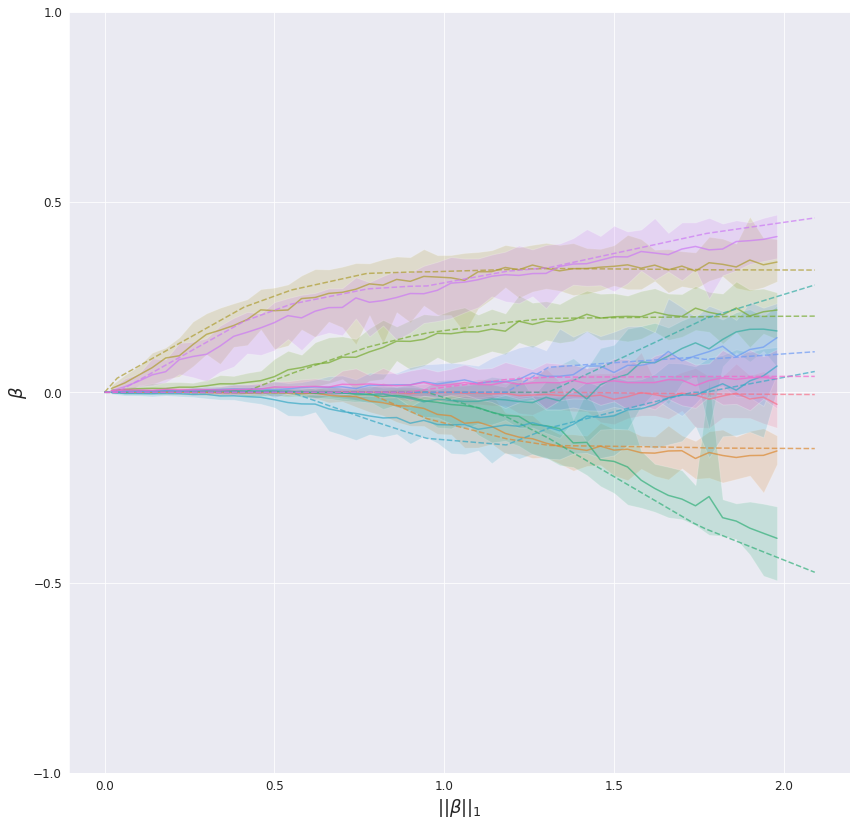

In [21]:
alphas_lasso = np.logspace(-1, 3, 100)

In [27]:
alphas_lasso = np.logspace(-1, 3, 100)
coefs, ci_l, ci_r, all_samples = [], [], [], []
conf = 0.95
for alpha in alphas_lasso:
    print("=+"*100)
    print('alpha: ', alpha)
    df_result = bayes_function(data_df, alpha=1/alpha, chain=1)
    bayes_samples = np.array(pd.DataFrame(df_result)).T
    bayes_samples = bayes_samples[:,1:-1]
    all_samples.append(bayes_samples)
    l_quant = np.quantile(bayes_samples, 1 - conf, axis=0)
    sample_mean = np.mean(bayes_samples, axis=0)
    r_quant = np.quantile(bayes_samples, conf, axis=0)
    coefs.append(sample_mean)
    ci_l.append(l_quant)
    ci_r.append(r_quant)

all_samples_raveled = np.concatenate(all_samples, 0)
all_samples = np.array(all_samples)
coefs = np.array(coefs)
ci_l = np.array(ci_l)
ci_r = np.array(ci_r)

(50, 50, 10)

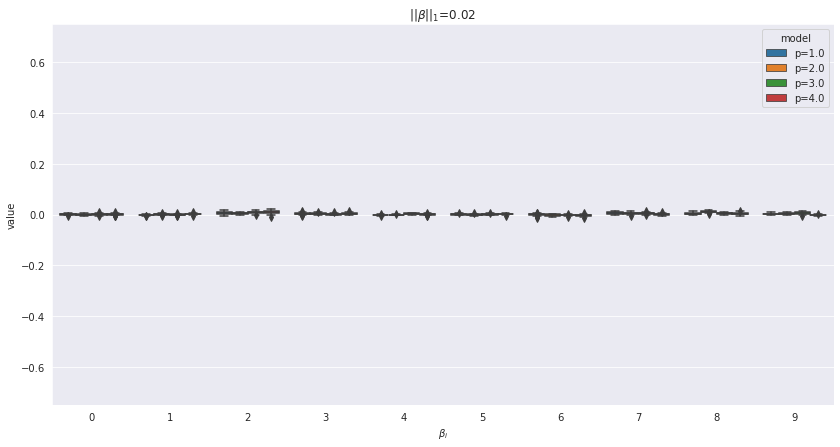

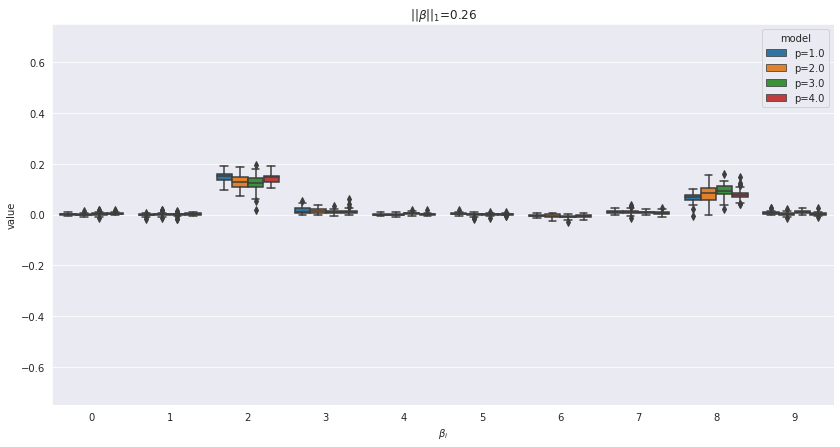

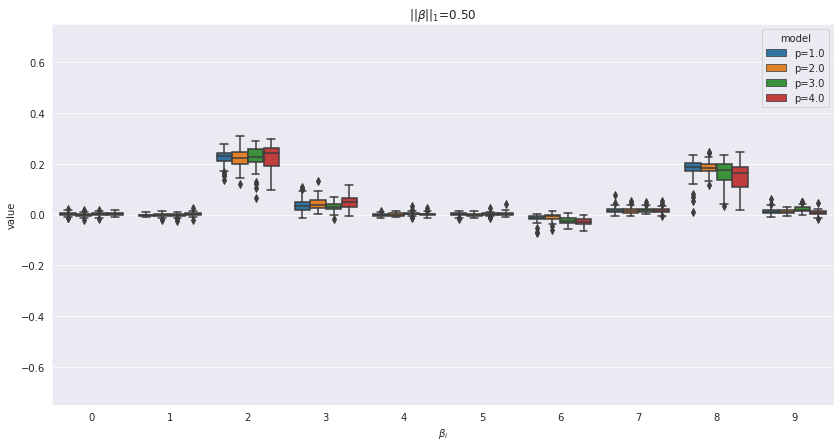

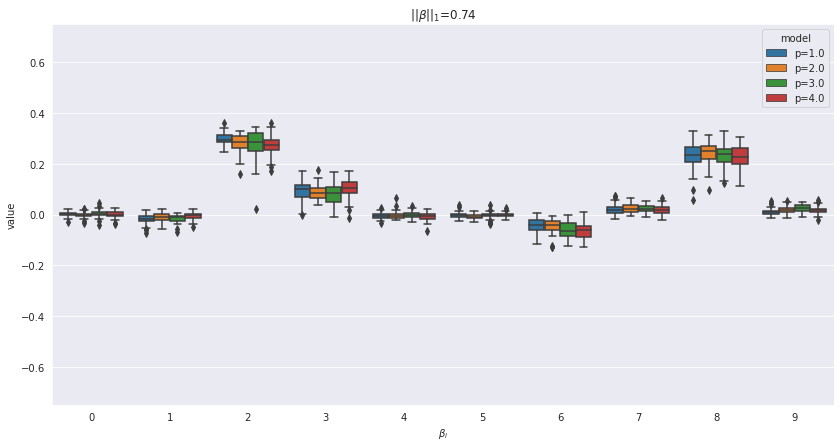

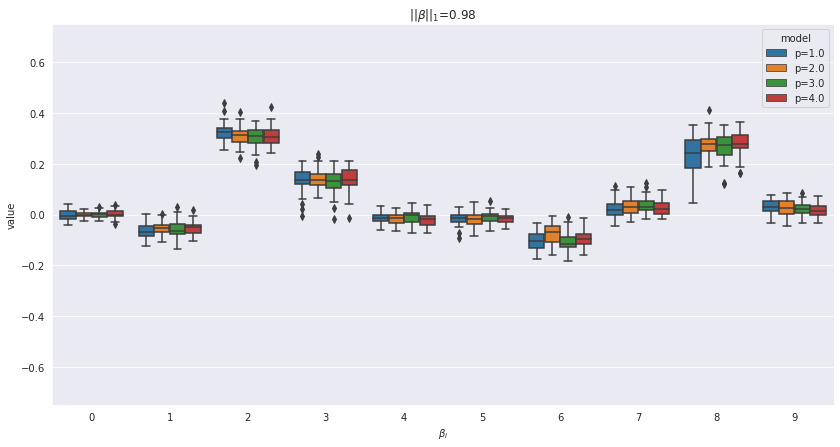

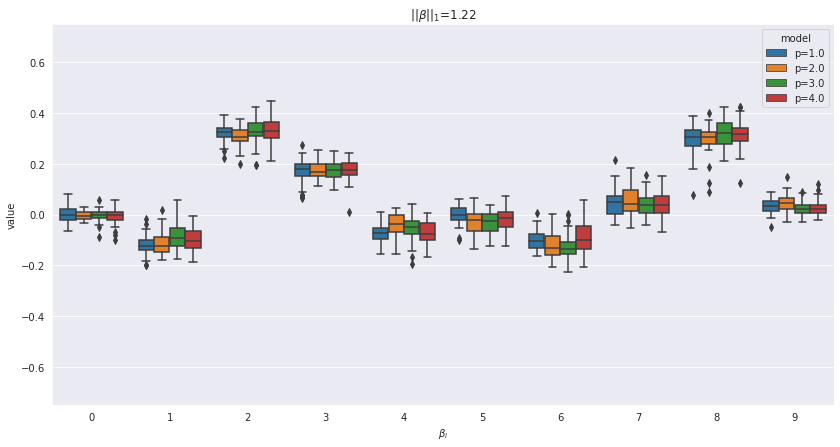

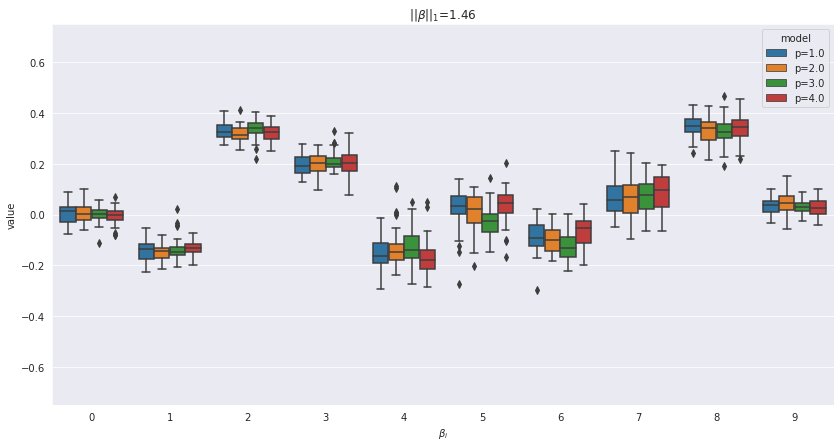

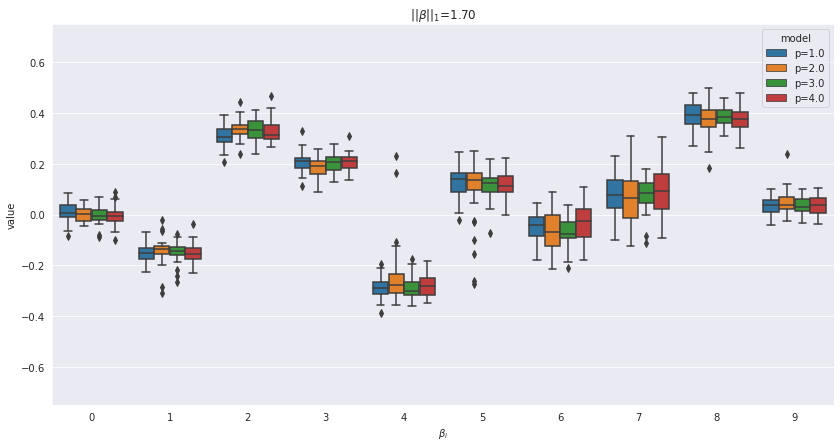

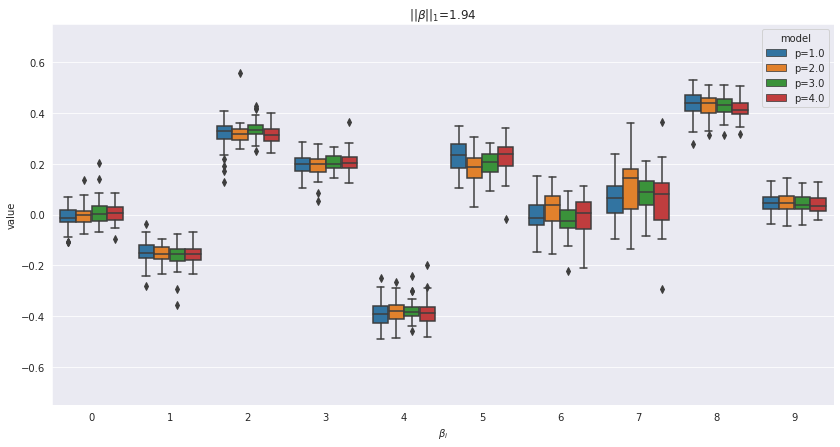

In [28]:
bins, samples_bayes, l_bayes, means_bayes, r_bayes = utils_.plot_betas_lambda(all_samples, alphas_lasso,  X_np, y_np, norm=params_flow['q'], a=0.95, folder_name=dir_name, n_plots=2)

### Bayesian linear regression comparison 
- Bayesian linear regression
- Normalizing Flow with Laplace prior and conditioned on $\lambda$
- Normalizing Flow defined on L1 manifold and conditioned on $||\beta||_1=t$

In [28]:
# sample from NF with Laplace prior
flow = utils_.build_cond_flow(flow_dim, q=q, n_layers=5, context_features=128, hidden_features=256, device=device)
flow.load_state_dict(torch.load("./models/flow_T_1"))
alphas_lasso = np.linspace(-1, 3, 10)
alphas_lasso_torch = torch.from_numpy(alphas_lasso).to(device).to(torch.float32).view(-1,1)
flow_samples, log_probs_samples = flow.sample_and_log_prob(1000, context=alphas_lasso_torch)
flow_samples_np = flow_samples.detach().cpu().numpy()
del flow_samples, log_probs_samples, flow
torch.cuda.empty_cache()
norms_flow = np.abs(flow_samples_np).sum(-1).mean(-1)

In [29]:
# sample from Bayesian Lasso 
coefs, ci_l, ci_r, norms_bayes_lasso = [], [], [], []
conf = 0.95
all_samples_bayes = {}
for alpha in 10**alphas_lasso:
    print("=+"*100)
    print('alpha: ', alpha)
    df_result = bayes_function(data_df, alpha=1/alpha, chain=1)
    bayes_samples = np.array(pd.DataFrame(df_result)).T
    bayes_samples = bayes_samples[:,1:-1]
    l_quant = np.quantile(bayes_samples, 1 - conf, axis=0)
    sample_mean = np.mean(bayes_samples, axis=0)
    r_quant = np.quantile(bayes_samples, conf, axis=0)
    sample_norm = np.abs(bayes_samples).sum(-1).mean()
    all_samples_bayes[f"{sample_norm:.4f}"] = bayes_samples
    norms_bayes_lasso.append(sample_norm)
    coefs.append(sample_mean)
    ci_l.append(l_quant)
    ci_r.append(r_quant)
    
coefs = np.array(coefs)
ci_l = np.array(ci_l)
ci_r = np.array(ci_r)
norms_bayes_lasso = np.array(norms_bayes_lasso)

=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+
alpha:  0.1

SAMPLING FOR MODEL 'continuous' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 2.4e-05 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.24 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800

In [30]:
# sample from NF on manifold
flow_manifold = utils_.build_cond_flow_manifold(flow_dim, q=q, n_layers=5, context_features=128, hidden_features=256, device=device)
flow_manifold.load_state_dict(torch.load("./models/flow_manifold_T_1"))
norms_flow_manifold = 0.5*(norms_bayes_lasso + norms_flow)
norms_flow_torch = torch.from_numpy(norms_flow_manifold).to(device).to(torch.float32).view(-1,1)
manifold_samples = []
for i in tqdm.tqdm(range(10)):
    flow_manifold_samples, log_probs_samples = flow_manifold.sample_and_log_prob(100, context=norms_flow_torch)
    manifold_samples.append(flow_manifold_samples.detach().cpu().numpy())
    del flow_manifold_samples, log_probs_samples
    torch.cuda.empty_cache()
flow_manifold_samples = np.concatenate(manifold_samples, 1)
del flow_manifold
torch.cuda.empty_cache()

100%|██████████| 10/10 [00:00<00:00, 16.21it/s]


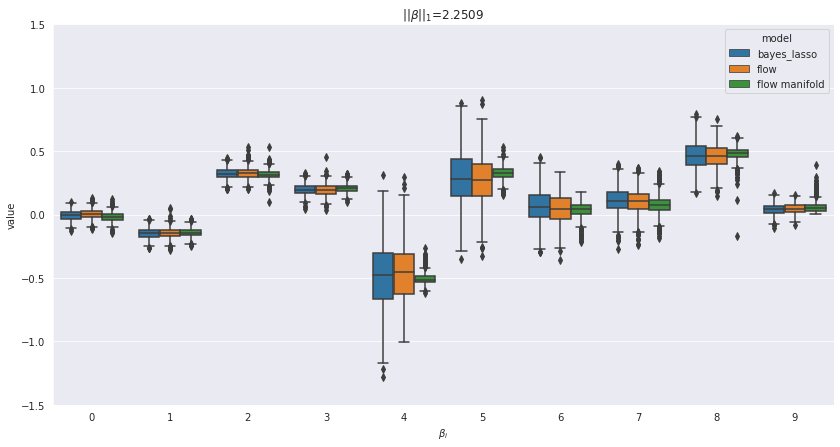

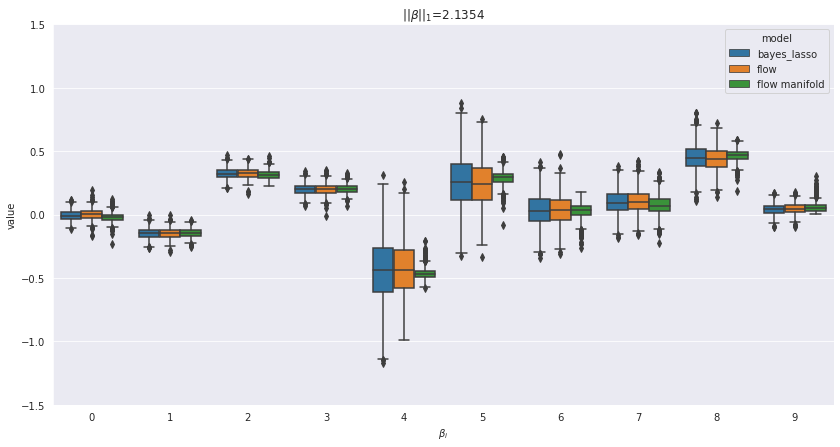

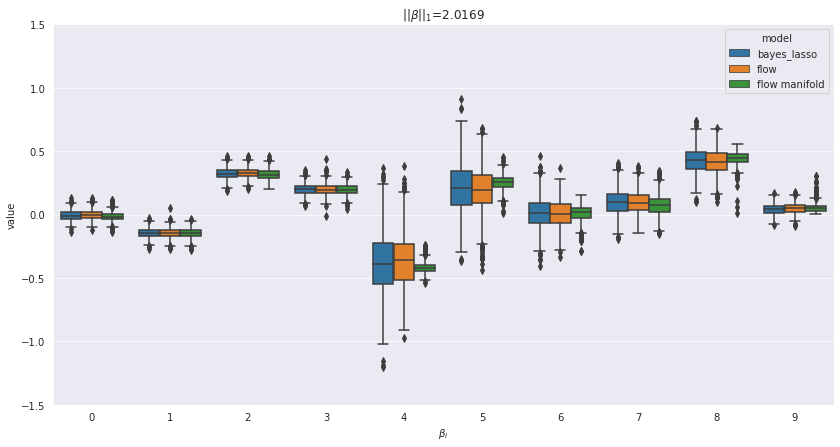

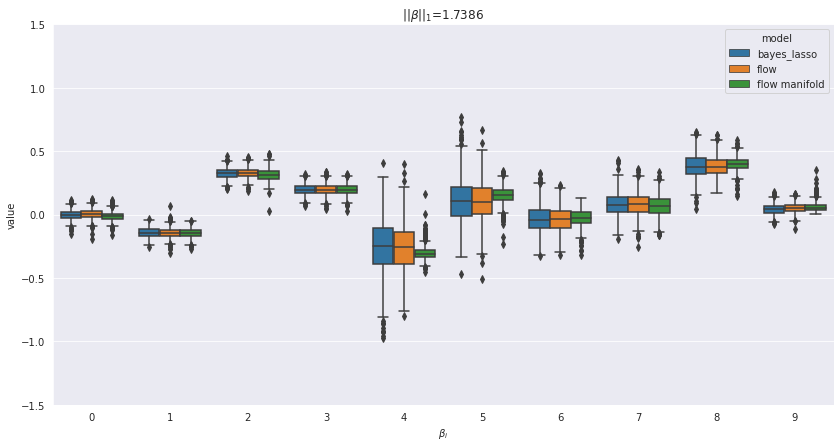

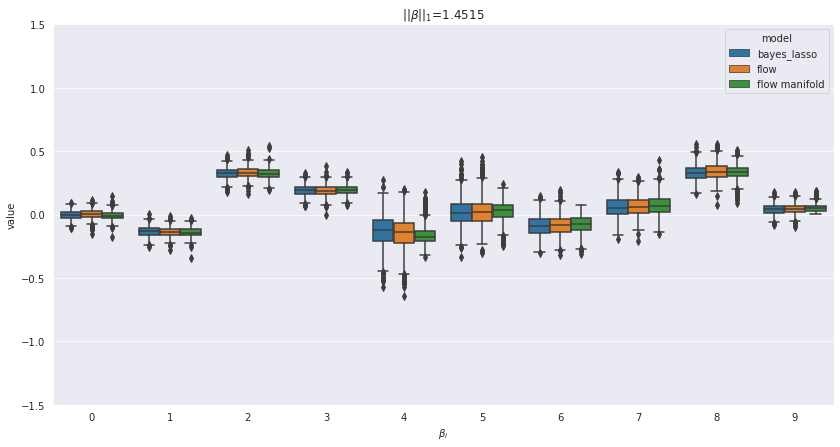

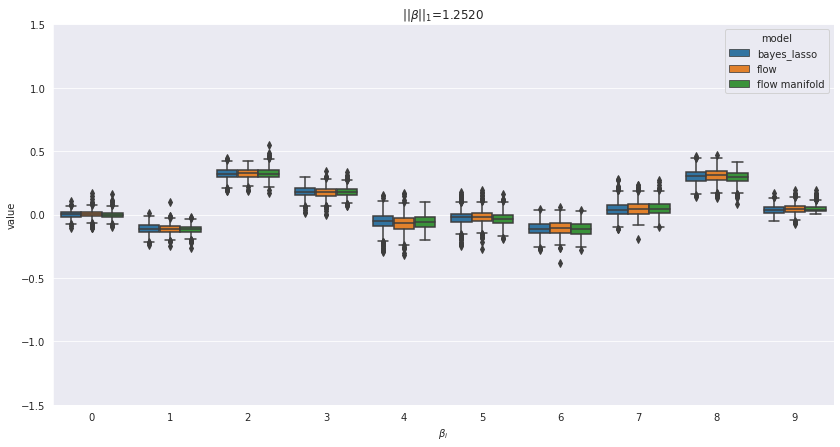

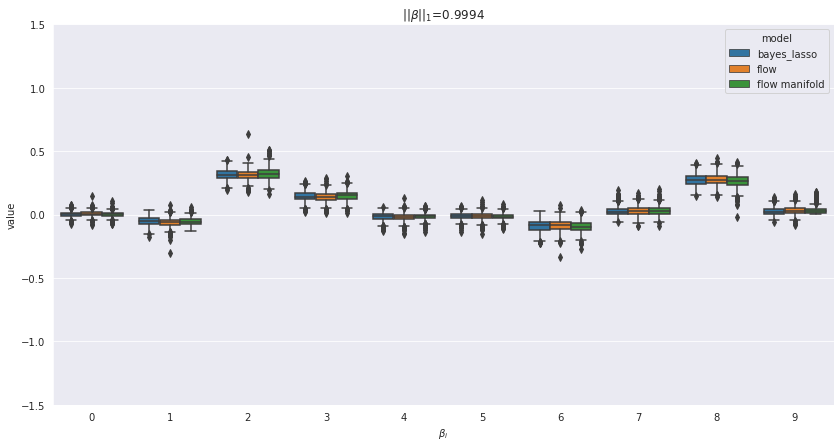

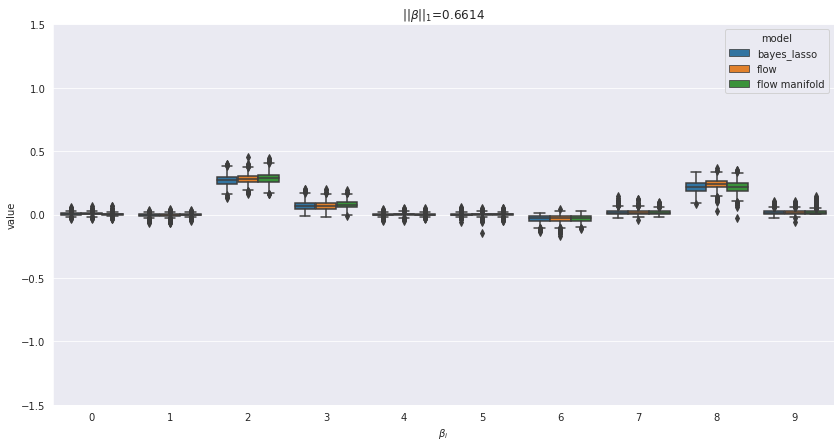

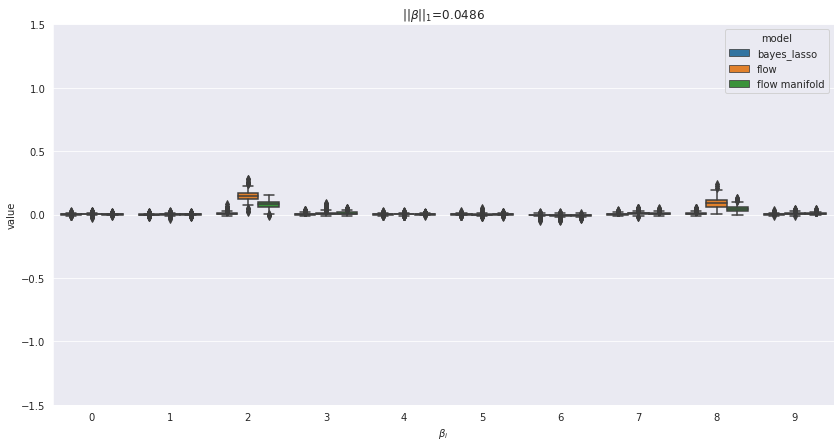

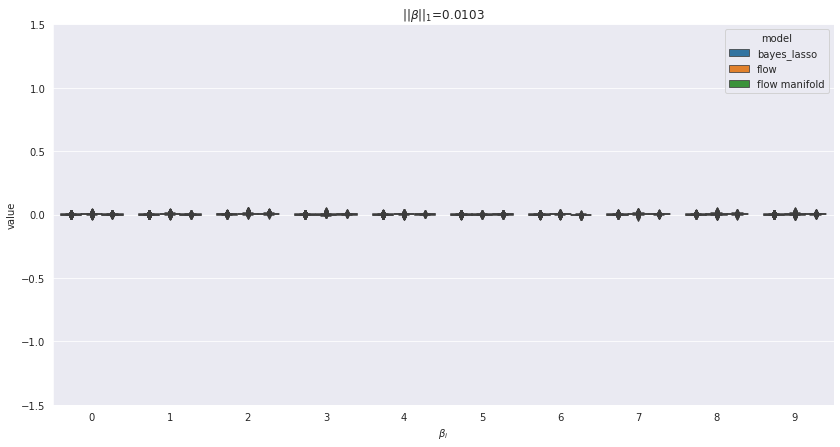

In [31]:
# plot comparison
for i, key_norm in enumerate(all_samples_bayes.keys()):
    plt.figure(figsize=(14,7))
    bayes_lasso_df = pd.DataFrame(all_samples_bayes[key_norm]).assign(model="bayes_lasso")
    flow_df = pd.DataFrame(flow_samples_np[i]).assign(model="flow")
    flow_manifold_df = pd.DataFrame(flow_manifold_samples[i]).assign(model="flow manifold")
    cdf = pd.concat([bayes_lasso_df, flow_df, flow_manifold_df])
    mdf = pd.melt(cdf, id_vars=['model'], var_name=r'$\beta_i$', value_name="value")
    sns.boxplot(x=r'$\beta_i$', y="value", hue="model", data=mdf)
    plt.title(r"$||\beta||_1$={}".format(key_norm))
    plt.ylim(-1.5,1.5)
    plt.savefig(f"./plots/box_plot_norm_lambda_{key_norm}.pdf")
    plt.show()

In [19]:
min_samples = min(samples_flow.shape[1], samples_bayes.shape[1])
bins_midpoints = 0.5 * (bins[1:]+bins[:-1])
# sample from NF on manifold
flow_manifold = utils_.build_cond_flow_manifold(flow_dim, q=q, n_layers=5, context_features=128, hidden_features=256, device=device)
flow_manifold.load_state_dict(torch.load("./models/flow_manifold_T_1"))
norms_flow_torch = torch.from_numpy(bins_midpoints).to(device).to(torch.float32).view(-1,1)
manifold_samples = []
for i in tqdm.tqdm(range(min_samples//20)):
    flow_manifold_samples, log_probs_samples = flow_manifold.sample_and_log_prob(20, context=norms_flow_torch)
    manifold_samples.append(flow_manifold_samples.detach().cpu().numpy())
    del flow_manifold_samples, log_probs_samples
    torch.cuda.empty_cache()
flow_manifold_samples = np.concatenate(manifold_samples, 1)
del flow_manifold
torch.cuda.empty_cache()

100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


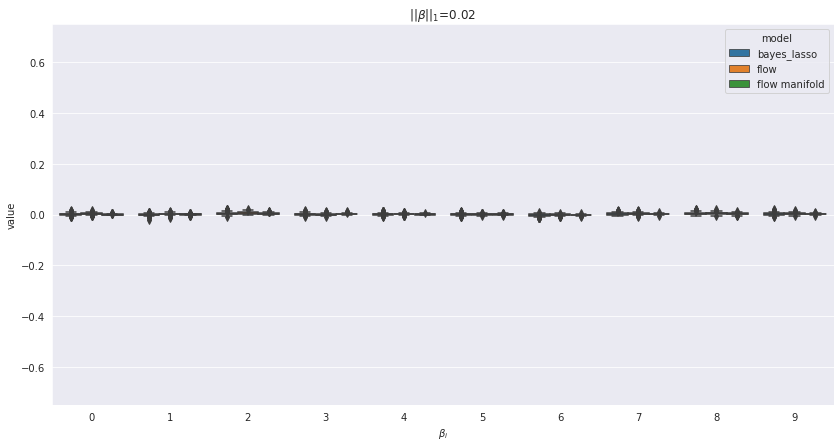

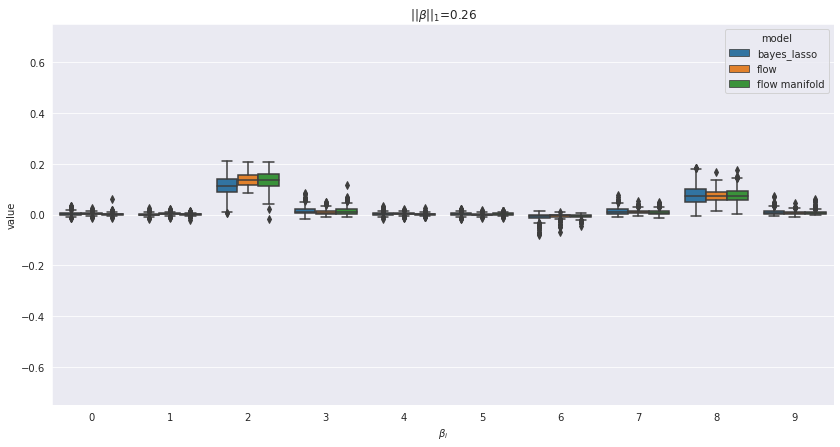

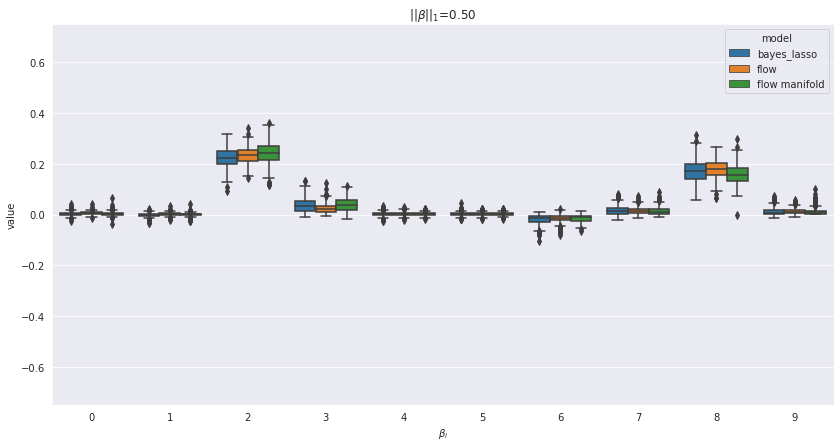

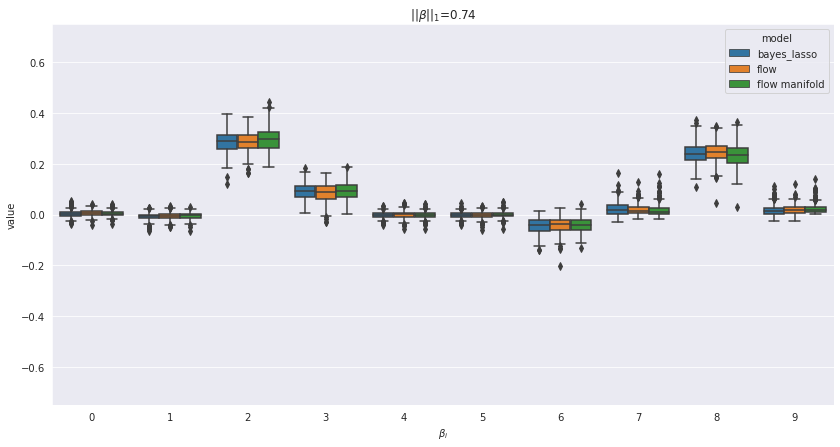

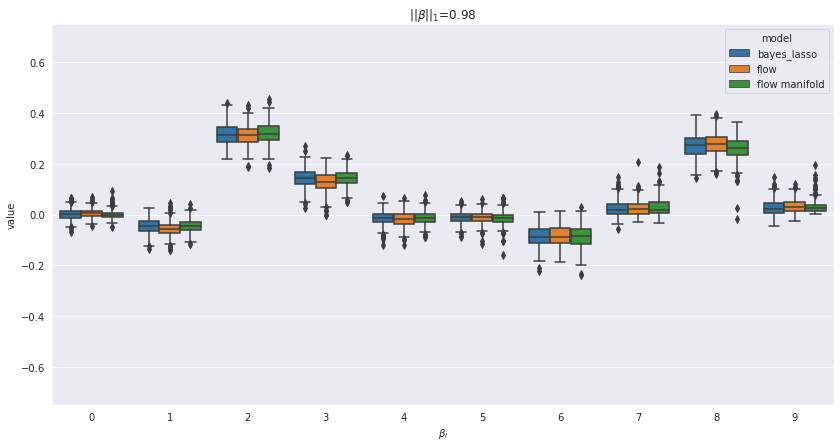

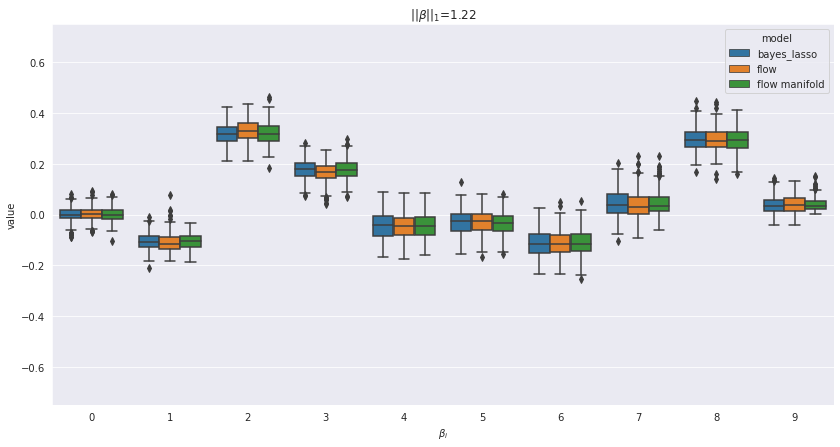

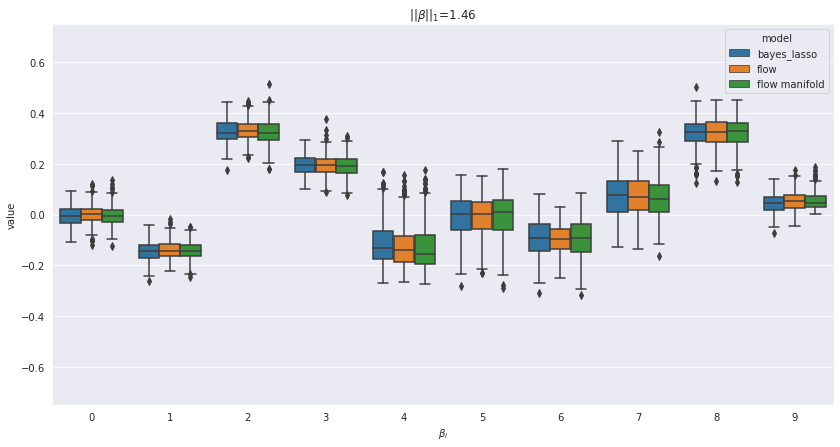

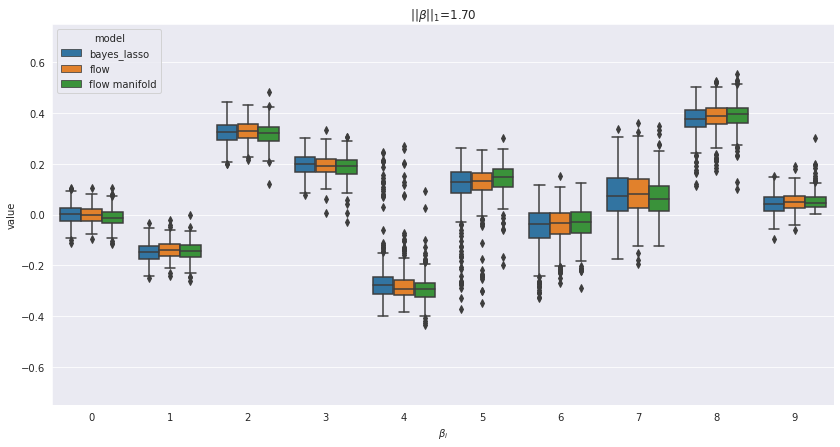

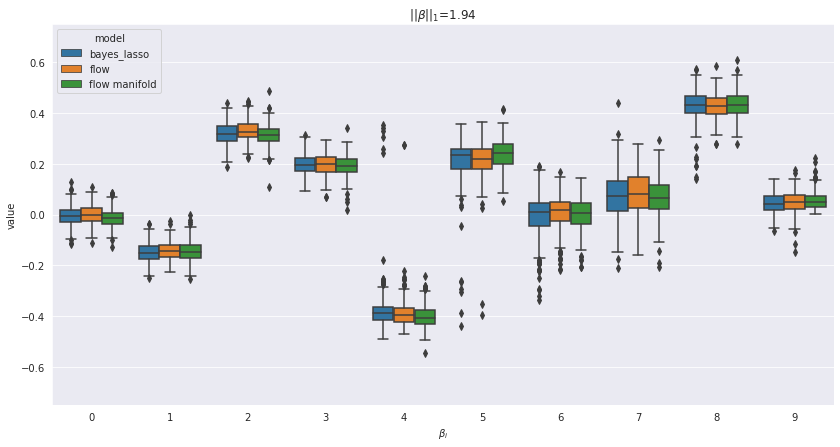

In [27]:
indeces = np.linspace(0,49,50).astype('int')[::6]

# plot comparison
for i in indeces:
    plt.figure(figsize=(14,7))
    bayes_lasso_df = pd.DataFrame(samples_bayes[i,:min_samples]).assign(model="bayes_lasso")
    flow_df = pd.DataFrame(samples_flow[i,:min_samples]).assign(model="flow")
    flow_manifold_df = pd.DataFrame(flow_manifold_samples[i]).assign(model="flow manifold")
    cdf = pd.concat([bayes_lasso_df, flow_df, flow_manifold_df])
    mdf = pd.melt(cdf, id_vars=['model'], var_name=r'$\beta_i$', value_name="value")
    sns.boxplot(x=r'$\beta_i$', y="value", hue="model", data=mdf)
    # sns.violinplot(x=r'$\beta_i$', y="value", hue="model", data=mdf)
    plt.title(r"$||\beta||_1$={:.2f}".format(bins_midpoints[i]))
    plt.ylim(-0.75,0.75)
    plt.savefig(f"./plots/box_plot_norm_{bins_midpoints[i]:.2f}.pdf")
    plt.show()